In [7]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, OneHotEncoder
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.impute import SimpleImputer
from datetime import datetime
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelBinarizer
import shap
from itertools import product
import plotly.graph_objects as go
from minisom import MiniSom
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import OPTICS

# Dane przygotowane do trenowania modeli

In [52]:
data = pd.read_csv('data_after_prep.csv')

In [9]:
data.columns

Index(['emp_length', 'annual_income', 'dti', 'loan_amount', 'total_acc',
       'is_employed', 'date_diff', 'location_Northeast', 'location_South',
       'location_West', 'wealth_low', 'wealth_med', 'law_regulations_moderate',
       'law_regulations_restrictive', 'purpose_grouped_credit card',
       'purpose_grouped_other', 'verification_status_Source Verified',
       'verification_status_Verified', 'loan_status_Current',
       'loan_status_Fully Paid', 'home_ownership_NONE', 'home_ownership_OTHER',
       'home_ownership_OWN', 'home_ownership_RENT', '60_month_term'],
      dtype='object')

In [54]:
data.head()

,emp_length,annual_income,dti,loan_amount,total_acc,is_employed,date_diff,location_Northeast,location_South,location_West,...,purpose_grouped_other,verification_status_Source Verified,verification_status_Verified,loan_status_Current,loan_status_Fully Paid,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,60_month_term
0,-1.396331,-1.227716,-1.849281,-1.249637,-1.638577,0.196775,1.961898,0,1,0,...,1,1,0,0,0,0,0,0,1,1
1,1.129782,-0.375292,-1.196722,-1.176650,-1.638577,0.196775,2.999245,0,0,1,...,1,1,0,0,1,0,0,0,1,0
2,-0.273614,-0.301255,1.132987,0.137112,-1.001180,0.196775,2.952447,0,0,1,...,1,0,0,0,0,0,0,0,1,0
3,-1.396331,-0.617473,-1.189222,-0.957690,-1.183294,0.196775,2.554668,0,1,0,...,1,1,0,0,1,0,0,0,0,1
4,1.410461,0.617947,-1.652763,-1.103663,0.546784,0.196775,2.999245,0,0,0,...,1,0,1,0,1,0,0,0,0,0


In [53]:
means = data.mean(axis=0)
stds = data.std(axis=0)

print("Średnie cech:", means)
print("Odchylenia standardowe cech:", stds)

Średnie cech: emp_length                            -1.267248e-16
annual_income                         -9.695917e-16
dti                                    6.483592e-17
loan_amount                           -8.841262e-17
total_acc                             -2.947087e-17
is_employed                            8.251844e-17
date_diff                              7.367718e-18
location_Northeast                     2.452043e-01
location_South                         3.279500e-01
location_West                          2.868882e-01
wealth_low                             6.789195e-02
wealth_med                             2.203443e-03
law_regulations_moderate               4.194318e-01
law_regulations_restrictive            4.779915e-01
purpose_grouped_credit card            1.295624e-01
purpose_grouped_other                  3.982787e-01
verification_status_Source Verified    2.534477e-01
verification_status_Verified           3.197584e-01
loan_status_Current                    2.846329e-0

Średnia bliska 0, odchylenie standardowe bliskie 1 co zapewnia, że dane są wystandaryzowane. (poza zmiennymi binarnymi)

In [10]:
X = data.select_dtypes(include=[float, int])

# Wizualizacje

## PCA

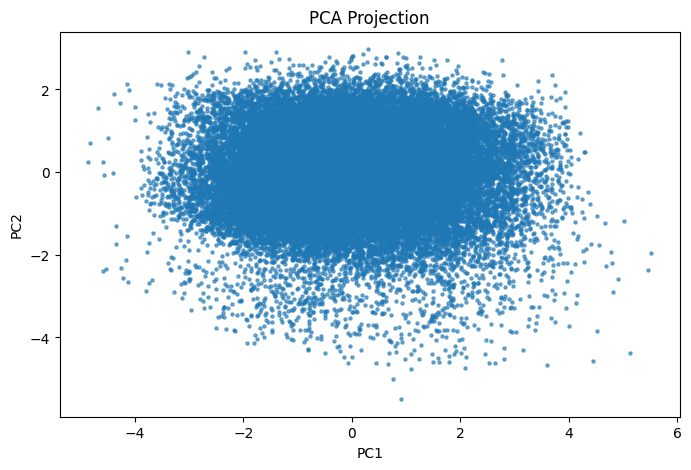

In [11]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

plt.figure(figsize=(8,5))
plt.scatter(X_pca[:,0], X_pca[:,1], s=5, alpha=0.6)
plt.title('PCA Projection')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

## TSNE

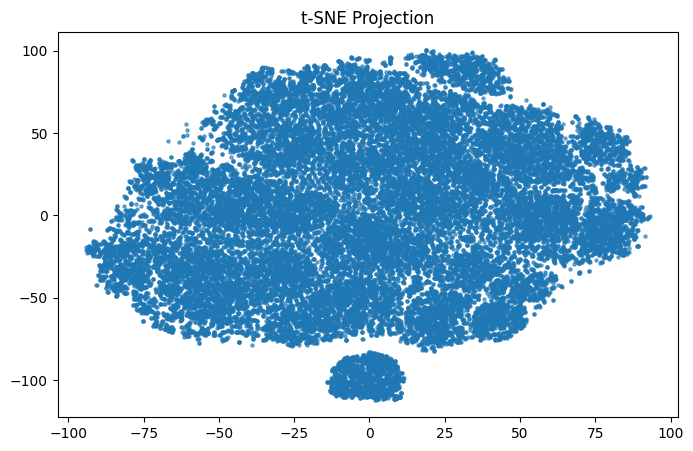

In [12]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(8,5))
plt.scatter(X_tsne[:,0], X_tsne[:,1], s=5, alpha=0.6)
plt.title('t-SNE Projection')
plt.show()

## UMAP

c:\Users\alapr\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\alapr\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


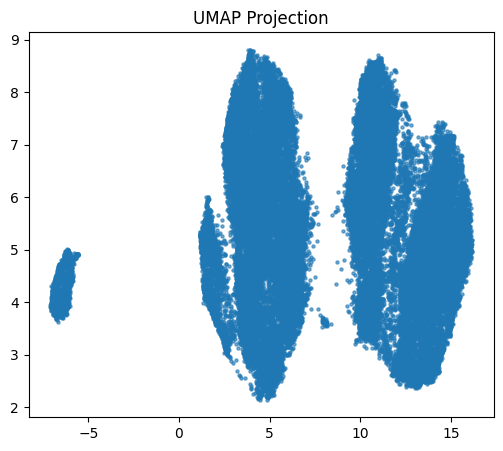

In [13]:
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap = umap_model.fit_transform(X)
plt.figure(figsize=(6,5))
plt.scatter(X_umap[:,0], X_umap[:,1], s=5, alpha=0.6)
plt.title('UMAP Projection')
plt.show()

# Redukowanie ilości zmiennych

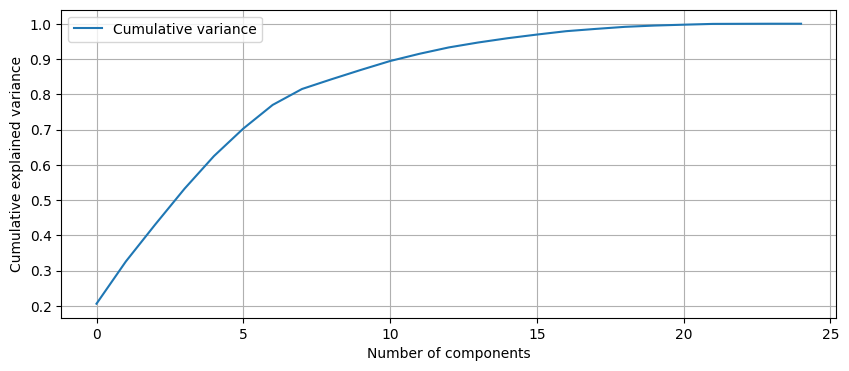

In [14]:
pca = PCA(n_components=X.shape[1], random_state=42)
pca.fit(X)

cum_var = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(10, 4))
plt.plot(cum_var, label='Cumulative variance')
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.legend()
plt.grid(True)
plt.show()

Ostatecznie decydujemy się na 10 komponentów zachowując 90% informacji.

In [15]:
X_pca = PCA(n_components=10, random_state=42).fit_transform(X)

# Parametry modeli

In [16]:
def model_eval(X, labels):
    unique_labels = set(labels)
    if len(unique_labels) < 2 or (len(unique_labels) == 1 and -1 in unique_labels):
        return {'silhouette': None, 'calinski': None, 'davies': None}
    
    silhouette = silhouette_score(X, labels)
    calinski = calinski_harabasz_score(X, labels)
    davies = davies_bouldin_score(X, labels)
    
    print(f'silhouette: {silhouette:.3f}, calinski: {calinski:.3f}, davies: {davies:.3f}')
    
    return {'silhouette': silhouette, 'calinski': calinski, 'davies': davies}

In [55]:
# --- KMeans Grid Search ---
def kmeans_grid_search(
    X,
    init_list=["k-means++", "random"],
    n_init_list=[10],
    algo_list=["lloyd", "elkan"],
    max_iter_list=[300],
    k_list=range(2, 8),
    scoring=["silhouette", "davies_bouldin_score"],
):
    results = []
    
    if "random" in init_list:
        n_init_list = list(set(n_init_list + [20]))

    for init, n_init, algo, max_iter, k, scoring_metric in product(
        init_list, n_init_list, algo_list, max_iter_list, k_list, scoring
    ):
        try:
            model = KMeans(
                n_clusters=k,
                init=init,
                n_init=n_init,
                algorithm=algo,
                max_iter=max_iter,
                random_state=42,
            )
            labels = model.fit_predict(X)
            
            if scoring_metric == "silhouette":
                score = silhouette_score(X, labels)
            elif scoring_metric == "davies_bouldin_score":
                score = -davies_bouldin_score(X, labels)  

            results.append({
                "params": f"k={k}, init={init}, n_init={n_init}, algo={algo}",
                "scoring": scoring_metric,
                "score": score,
            })
        except Exception as e:
            print(f"Błąd dla parametrów k={k}, init={init}, n_init={n_init}: {e}")
            continue

    result_df = pd.DataFrame(results)
    result_df["sort_key"] = result_df["score"] * np.where(result_df["scoring"] == "silhouette", 1, -1)
    return result_df.sort_values(by="sort_key", ascending=False).drop("sort_key", axis=1)

# --- Agglomerative Grid Search ---
def agglo_grid_search(X, linkage_list=["ward", "complete", "average", "single"], k_list=range(2, 8), scoring="silhouette"):
    results = []

    for linkage, k in product(linkage_list, k_list):
        try:
            model = AgglomerativeClustering(n_clusters=k, linkage=linkage)
            labels = model.fit_predict(X)
            score = silhouette_score(X, labels) if scoring == "silhouette" else None
            results.append({
                "model": "Agglomerative",
                "params": f"k={k}, linkage={linkage}",
                "score": score
            })
        except Exception:
            continue

    return pd.DataFrame(results).sort_values(by="score", ascending=False)

# --- GMM Grid Search ---
def gmm_grid_search(X, covariance_list=["full", "tied", "diag", "spherical"], k_list=range(2, 8), scoring="silhouette"):
    results = []

    for cov_type, k in product(covariance_list, k_list):
        try:
            model = GaussianMixture(n_components=k, covariance_type=cov_type, random_state=42)
            labels = model.fit(X).predict(X)
            score = silhouette_score(X, labels) if scoring == "silhouette" else None
            results.append({
                "model": "GMM",
                "params": f"k={k}, covariance={cov_type}",
                "score": score
            })
        except Exception:
            continue

    return pd.DataFrame(results).sort_values(by="score", ascending=False)

# --- DBSCAN Grid Search ---
def dbscan_grid_search(X, eps_list=[0.3, 0.5, 0.7, 1.0, 5.0], min_samples_list=[3, 5, 10], scoring="silhouette"):
    results = []

    for eps, min_s in product(eps_list, min_samples_list):
        try:
            model = DBSCAN(eps=eps, min_samples=min_s)
            labels = model.fit_predict(X)
            if len(set(labels)) <= 1 or len(set(labels)) >= len(X):  # skip noise-only or all-unique
                score = None
            else:
                score = silhouette_score(X, labels) if scoring == "silhouette" else None
            results.append({
                "model": "DBSCAN",
                "params": f"eps={eps}, min_samples={min_s}",
                "score": score
            })
        except Exception:
            continue

    return pd.DataFrame(results).sort_values(by="score", ascending=False)

# --- OPTICS Grid Search ---
def optics_grid_search(X, max_eps_list=[0.3, 0.5, 0.7, 1.0, 5.0], min_samples_list=[3, 5, 10], scoring="silhouette"):
    results = []

    for max_eps, min_s in product(max_eps_list, min_samples_list):
        try:
            model = OPTICS(max_eps=max_eps, min_samples=min_s)
            labels = model.fit_predict(X)
            # Skip if only noise or all unique clusters (noise as -1, clusters >=0)
            unique_labels = set(labels)
            n_clusters = len(unique_labels) - (1 if -1 in unique_labels else 0)
            if n_clusters <= 1 or n_clusters >= len(X):
                score = None
            else:
                score = silhouette_score(X, labels) if scoring == "silhouette" else None
            results.append({
                "model": "OPTICS",
                "params": f"max_eps={max_eps}, min_samples={min_s}",
                "score": score
            })
        except Exception:
            continue

    return pd.DataFrame(results).sort_values(by="score", ascending=False)


## Grid search

In [56]:
results_kmeans = kmeans_grid_search(X_pca)
print(results_kmeans)
results_kmeans.to_csv("results_kmeans.txt", index=False)

                                        params               scoring     score
51     k=3, init=random, n_init=10, algo=lloyd  davies_bouldin_score -2.374934
63     k=3, init=random, n_init=10, algo=elkan  davies_bouldin_score -2.374934
61     k=2, init=random, n_init=10, algo=elkan  davies_bouldin_score -2.212610
49     k=2, init=random, n_init=10, algo=lloyd  davies_bouldin_score -2.212610
73     k=2, init=random, n_init=20, algo=lloyd  davies_bouldin_score -2.212610
..                                         ...                   ...       ...
10  k=7, init=k-means++, n_init=10, algo=lloyd            silhouette  0.117798
58     k=7, init=random, n_init=10, algo=lloyd            silhouette  0.117237
70     k=7, init=random, n_init=10, algo=elkan            silhouette  0.117237
62     k=3, init=random, n_init=10, algo=elkan            silhouette  0.117079
50     k=3, init=random, n_init=10, algo=lloyd            silhouette  0.117079

[96 rows x 3 columns]


In [57]:
results_agglo = agglo_grid_search(X_pca)
print(results_agglo)
results_agglo.to_csv("results_agglo.txt", index=False)

            model                 params     score
12  Agglomerative   k=2, linkage=average  0.561251
0   Agglomerative      k=2, linkage=ward  0.438699
18  Agglomerative    k=2, linkage=single  0.438699
19  Agglomerative    k=3, linkage=single  0.437698
13  Agglomerative   k=3, linkage=average  0.437025
20  Agglomerative    k=4, linkage=single  0.434828
14  Agglomerative   k=4, linkage=average  0.431530
15  Agglomerative   k=5, linkage=average  0.428414
21  Agglomerative    k=5, linkage=single  0.382794
22  Agglomerative    k=6, linkage=single  0.379234
23  Agglomerative    k=7, linkage=single  0.375242
16  Agglomerative   k=6, linkage=average  0.298458
6   Agglomerative  k=2, linkage=complete  0.210611
17  Agglomerative   k=7, linkage=average  0.196502
1   Agglomerative      k=3, linkage=ward  0.126644
2   Agglomerative      k=4, linkage=ward  0.109546
3   Agglomerative      k=5, linkage=ward  0.090692
8   Agglomerative  k=4, linkage=complete  0.078007
4   Agglomerative      k=6, lin

In [58]:
results_gmm = gmm_grid_search(X_pca)
print(results_gmm)
results_gmm.to_csv("results_gmm.txt", index=False)

   model                     params     score
0    GMM       k=2, covariance=full  0.438699
12   GMM       k=2, covariance=diag  0.438699
19   GMM  k=3, covariance=spherical  0.160094
18   GMM  k=2, covariance=spherical  0.150481
6    GMM       k=2, covariance=tied  0.147577
2    GMM       k=4, covariance=full  0.119059
22   GMM  k=6, covariance=spherical  0.114381
21   GMM  k=5, covariance=spherical  0.113135
13   GMM       k=3, covariance=diag  0.111131
23   GMM  k=7, covariance=spherical  0.110775
20   GMM  k=4, covariance=spherical  0.109929
9    GMM       k=5, covariance=tied  0.104182
7    GMM       k=3, covariance=tied  0.100838
14   GMM       k=4, covariance=diag  0.098729
11   GMM       k=7, covariance=tied  0.096152
8    GMM       k=4, covariance=tied  0.095934
10   GMM       k=6, covariance=tied  0.093270
17   GMM       k=7, covariance=diag  0.072941
3    GMM       k=5, covariance=full  0.068201
15   GMM       k=5, covariance=diag  0.064300
4    GMM       k=6, covariance=ful

In [59]:
results_dbscan = dbscan_grid_search(X_pca)
print(results_dbscan)
results_dbscan.to_csv("results_dbscan.txt", index=False)

     model                   params     score
14  DBSCAN  eps=5.0, min_samples=10  0.438699
12  DBSCAN   eps=5.0, min_samples=3  0.438699
13  DBSCAN   eps=5.0, min_samples=5  0.438699
0   DBSCAN   eps=0.3, min_samples=3  0.419354
11  DBSCAN  eps=1.0, min_samples=10 -0.192885
10  DBSCAN   eps=1.0, min_samples=5 -0.306235
4   DBSCAN   eps=0.5, min_samples=5 -0.405160
9   DBSCAN   eps=1.0, min_samples=3 -0.408712
8   DBSCAN  eps=0.7, min_samples=10 -0.455455
7   DBSCAN   eps=0.7, min_samples=5 -0.518950
6   DBSCAN   eps=0.7, min_samples=3 -0.519627
3   DBSCAN   eps=0.5, min_samples=3 -0.573764
1   DBSCAN   eps=0.3, min_samples=5       NaN
2   DBSCAN  eps=0.3, min_samples=10       NaN
5   DBSCAN  eps=0.5, min_samples=10       NaN


In [60]:
results_optics = optics_grid_search(X_pca)
print(results_optics)
results_optics.to_csv("results_optics.txt", index=False)

     model                       params     score
14  OPTICS  max_eps=5.0, min_samples=10  0.009070
11  OPTICS  max_eps=1.0, min_samples=10 -0.008163
4   OPTICS   max_eps=0.5, min_samples=5 -0.327650
8   OPTICS  max_eps=0.7, min_samples=10 -0.393623
12  OPTICS   max_eps=5.0, min_samples=3 -0.497215
9   OPTICS   max_eps=1.0, min_samples=3 -0.502124
6   OPTICS   max_eps=0.7, min_samples=3 -0.523204
7   OPTICS   max_eps=0.7, min_samples=5 -0.543824
10  OPTICS   max_eps=1.0, min_samples=5 -0.558235
13  OPTICS   max_eps=5.0, min_samples=5 -0.558557
3   OPTICS   max_eps=0.5, min_samples=3 -0.562910
0   OPTICS   max_eps=0.3, min_samples=3       NaN
1   OPTICS   max_eps=0.3, min_samples=5       NaN
2   OPTICS  max_eps=0.3, min_samples=10       NaN
5   OPTICS  max_eps=0.5, min_samples=10       NaN


## Optymalna ilość klastrów

In [23]:
def find_optimal_clusters_multi_algorithm(X, algorithms=None, max_k=20):
    """
    Evaluate multiple clustering algorithms across different k values
    """
    
    if algorithms is None:
        algorithms = {
            'KMeans': KMeans,
            'AgglomerativeClustering': AgglomerativeClustering,
            'GaussianMixture': GaussianMixture
        }
    
    results = {}
    k_range = range(2, max_k + 1)
    
    print("Multi-Algorithm Cluster Evaluation:")
    print("=" * 60)
    
    for algo_name, algo_class in algorithms.items():
        print(f"\n{algo_name} Results:")
        print("-" * 40)
        
        silhouette_scores = []
        calinski_scores = []
        davies_scores = []
        inertias = []
        
        for k in k_range:
            print(f"\nK = {k}:")
            
            try:
                # Handle different algorithm parameter names
                if algo_name == 'GaussianMixture':
                    model = algo_class(n_components=k, random_state=42)
                    model.fit(X)
                    labels = model.predict(X)
                    inertia = None  # GMM doesn't have inertia
                elif algo_name == 'AgglomerativeClustering':
                    model = algo_class(n_clusters=k)
                    labels = model.fit_predict(X)
                    inertia = getattr(model, 'inertia_', None)
                else:
                    model = algo_class(n_clusters=k, random_state=42)
                    labels = model.fit_predict(X)
                    inertia = getattr(model, 'inertia_', None)
                
                # Evaluate clustering
                metrics = model_eval(X, labels)
                
                silhouette_scores.append(metrics['silhouette'])
                calinski_scores.append(metrics['calinski'])
                davies_scores.append(metrics['davies'])
                inertias.append(inertia)
                
            except Exception as e:
                print(f"Error with {algo_name} at k={k}: {e}")
                silhouette_scores.append(None)
                calinski_scores.append(None)
                davies_scores.append(None)
                inertias.append(None)
        
        # Store results
        results[algo_name] = {
            'silhouette_scores': silhouette_scores,
            'calinski_scores': calinski_scores,
            'davies_scores': davies_scores,
            'inertias': inertias
        }
    
    # Plot comparison
    plot_algorithm_comparison(results, k_range)
    
    # Find best k for each algorithm and metric
    print_best_k_summary(results, k_range)
    
    return results

def plot_algorithm_comparison(results, k_range):
    """Plot comparison of different algorithms across metrics"""
    
    algorithms = list(results.keys())
    n_algorithms = len(algorithms)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    
    metrics = ['silhouette_scores', 'calinski_scores', 'davies_scores', 'inertias']
    titles = ['Silhouette Score (Higher is Better)', 
              'Calinski-Harabasz Score (Higher is Better)',
              'Davies-Bouldin Score (Lower is Better)', 
              'Inertia/WCSS (Lower is Better)']
    
    colors = ['blue', 'red', 'green', 'orange', 'purple', 'brown']
    
    for i, (metric, title) in enumerate(zip(metrics, titles)):
        ax = axes[i]
        
        for j, algo in enumerate(algorithms):
            scores = results[algo][metric]
            # Filter out None values
            valid_k = [k for k, score in zip(k_range, scores) if score is not None]
            valid_scores = [score for score in scores if score is not None]
            
            if valid_scores:  # Only plot if we have valid scores
                ax.plot(valid_k, valid_scores, marker='o', 
                       label=algo, color=colors[j % len(colors)])
        
        ax.set_title(title)
        ax.set_xlabel('Number of clusters (k)')
        ax.set_ylabel(title.split('(')[0].strip())
        ax.legend()
        ax.grid(True)
    
    plt.tight_layout()
    plt.show()

def print_best_k_summary(results, k_range):
    """Print summary of best k for each algorithm and metric"""
    
    print(f"\n{'='*60}")
    print("BEST K SUMMARY")
    print(f"{'='*60}")
    
    for algo in results.keys():
        print(f"\n{algo}:")
        
        # Silhouette (higher is better)
        sil_scores = results[algo]['silhouette_scores']
        valid_sil = [(k, score) for k, score in zip(k_range, sil_scores) if score is not None]
        if valid_sil:
            best_k_sil = max(valid_sil, key=lambda x: x[1])
            print(f"  Best k (Silhouette): {best_k_sil[0]} (score: {best_k_sil[1]:.3f})")
        
        # Calinski-Harabasz (higher is better)
        cal_scores = results[algo]['calinski_scores']
        valid_cal = [(k, score) for k, score in zip(k_range, cal_scores) if score is not None]
        if valid_cal:
            best_k_cal = max(valid_cal, key=lambda x: x[1])
            print(f"  Best k (Calinski-Harabasz): {best_k_cal[0]} (score: {best_k_cal[1]:.3f})")
        
        # Davies-Bouldin (lower is better)
        dav_scores = results[algo]['davies_scores']
        valid_dav = [(k, score) for k, score in zip(k_range, dav_scores) if score is not None]
        if valid_dav:
            best_k_dav = min(valid_dav, key=lambda x: x[1])
            print(f"  Best k (Davies-Bouldin): {best_k_dav[0]} (score: {best_k_dav[1]:.3f})")


Multi-Algorithm Cluster Evaluation:

GaussianMixture Results:
----------------------------------------

K = 2:
silhouette: 0.439, calinski: 5286.341, davies: 1.028

K = 3:
silhouette: 0.043, calinski: 3193.756, davies: 4.338

K = 4:
silhouette: 0.119, calinski: 3308.024, davies: 2.139

K = 5:
silhouette: 0.068, calinski: 3882.793, davies: 2.497

K = 6:
silhouette: 0.053, calinski: 2468.691, davies: 3.709

K = 7:
silhouette: 0.015, calinski: 2412.423, davies: 3.021

K = 8:
silhouette: -0.007, calinski: 2018.709, davies: 3.910

K = 9:
silhouette: 0.012, calinski: 1810.558, davies: 4.211

K = 10:
silhouette: 0.031, calinski: 1926.323, davies: 3.701

K = 11:
silhouette: -0.001, calinski: 1748.631, davies: 4.357

K = 12:
silhouette: -0.046, calinski: 1527.076, davies: 3.022

K = 13:
silhouette: -0.059, calinski: 1498.376, davies: 2.862

K = 14:
silhouette: -0.033, calinski: 1328.209, davies: 4.394

K = 15:
silhouette: -0.043, calinski: 1261.321, davies: 4.354

K = 16:
silhouette: -0.058, ca

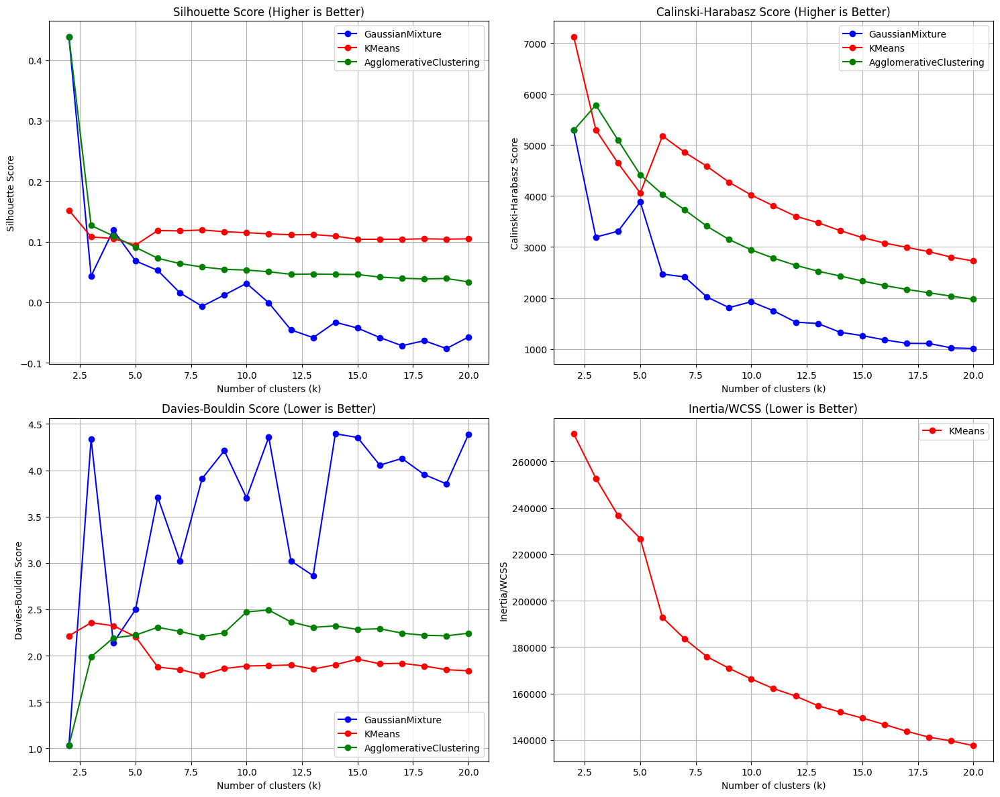


BEST K SUMMARY

GaussianMixture:
  Best k (Silhouette): 2 (score: 0.439)
  Best k (Calinski-Harabasz): 2 (score: 5286.341)
  Best k (Davies-Bouldin): 2 (score: 1.028)

KMeans:
  Best k (Silhouette): 2 (score: 0.152)
  Best k (Calinski-Harabasz): 2 (score: 7124.195)
  Best k (Davies-Bouldin): 8 (score: 1.791)

AgglomerativeClustering:
  Best k (Silhouette): 2 (score: 0.439)
  Best k (Calinski-Harabasz): 3 (score: 5781.698)
  Best k (Davies-Bouldin): 2 (score: 1.028)


In [24]:
algorithms = {  
        'GaussianMixture': GaussianMixture,
        'KMeans': KMeans,
        'AgglomerativeClustering': AgglomerativeClustering,
        }

results = find_optimal_clusters_multi_algorithm(X_pca, max_k=20, algorithms=algorithms)

# Modele i wizualizacje klasteryzacji

In [64]:
def plot_tsne_umap_clusters(X_tsne, X_umap, labels, title_tsne='t-SNE', title_umap='UMAP'):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # t-SNE
    sc1 = axes[0].scatter(X_tsne[:,0], X_tsne[:,1], c=labels, s=5, alpha=0.6, cmap='Spectral')
    axes[0].set_title(title_tsne)
    plt.colorbar(sc1, ax=axes[0], label='Cluster Label')
    
    # UMAP
    sc2 = axes[1].scatter(X_umap[:,0], X_umap[:,1], c=labels, s=5, alpha=0.6, cmap='Spectral')
    axes[1].set_title(title_umap)
    plt.colorbar(sc2, ax=axes[1], label='Cluster Label')
    
    plt.tight_layout()
    plt.show()


In [65]:
labels_dict = {}

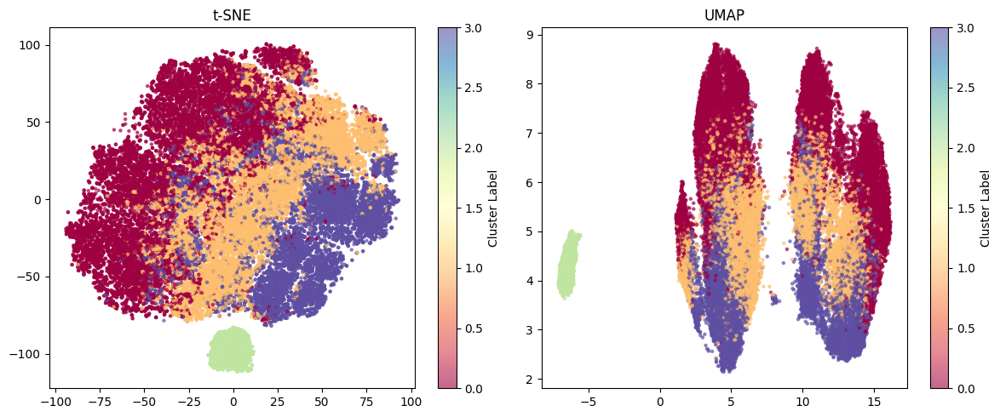

In [66]:
kmeans1 = KMeans(n_clusters=4, init = 'k-means++', n_init=10, algorithm= 'elkan', random_state=42).fit(X)
labels_kmeans1 = kmeans1.labels_
labels_dict['kmeans1'] = labels_kmeans1
plot_tsne_umap_clusters(X_tsne, X_umap, labels_kmeans1)

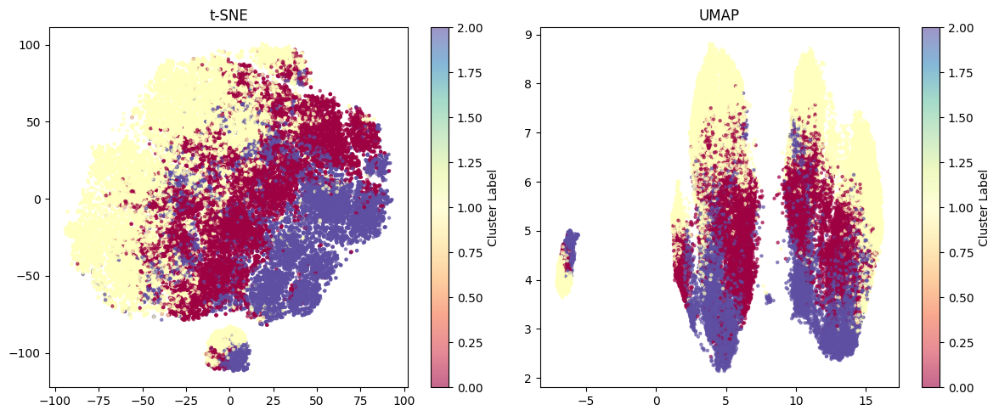

In [67]:
kmeans2 = KMeans(n_clusters=3, init = 'random', n_init=10, algorithm= 'lloyd', random_state=42).fit(X)
labels_kmeans2 = kmeans2.labels_
labels_dict['kmeans2'] = labels_kmeans2
plot_tsne_umap_clusters(X_tsne, X_umap, labels_kmeans2)

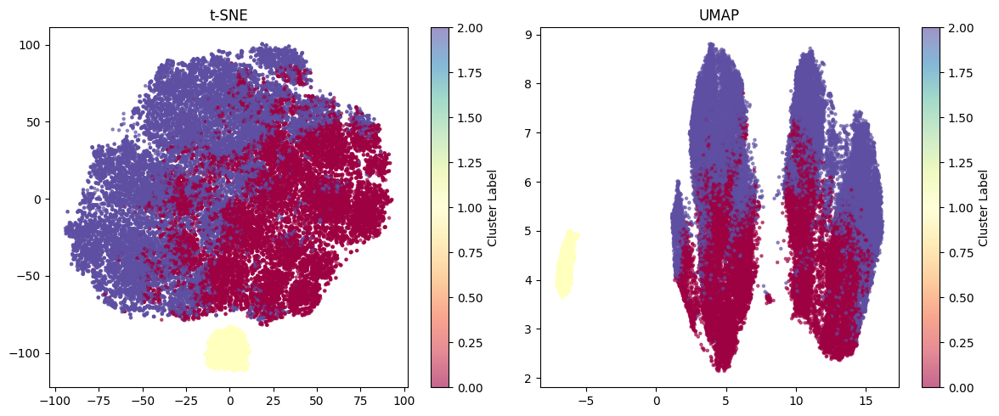

In [68]:
kmeans3 = KMeans(n_clusters=3, init = 'random', n_init=20, algorithm= 'elkan', random_state=42).fit(X)
labels_kmeans3 = kmeans3.labels_
labels_dict['kmeans3'] = labels_kmeans3
plot_tsne_umap_clusters(X_tsne, X_umap, labels_kmeans3)

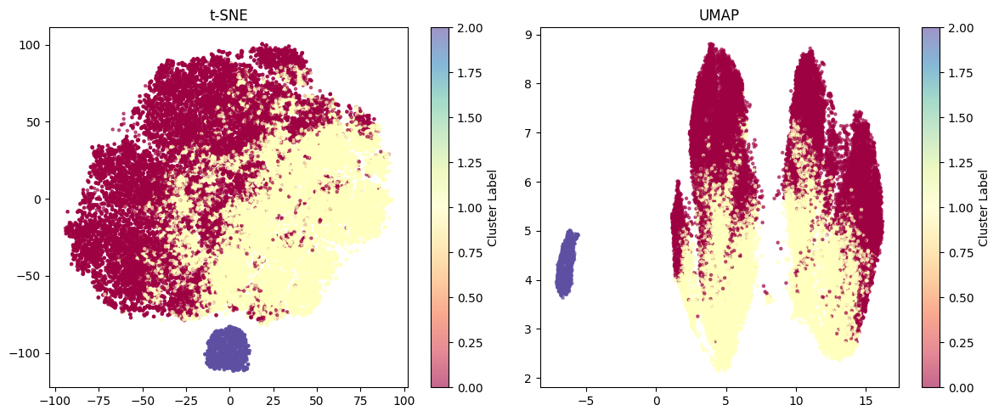

In [69]:
kmeans3 = KMeans(n_clusters=3, init = 'k-means++', n_init=20, algorithm= 'elkan', random_state=42).fit(X)
labels_kmeans3 = kmeans3.labels_
labels_dict['kmeans3'] = labels_kmeans3
plot_tsne_umap_clusters(X_tsne, X_umap, labels_kmeans3)

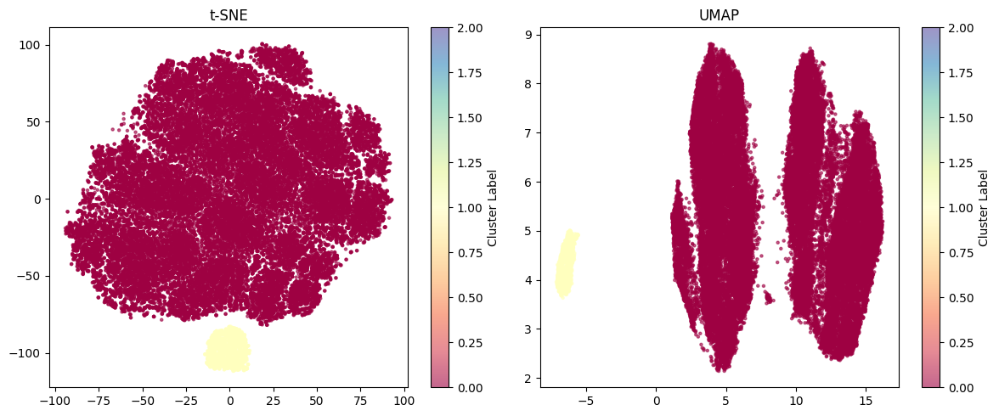

In [70]:
agglomerative1 = AgglomerativeClustering(n_clusters=3, linkage='single').fit(X)
labels_agglomerative1 = agglomerative1.labels_
labels_dict['agglomerative1'] = labels_agglomerative1
plot_tsne_umap_clusters(X_tsne, X_umap, labels_agglomerative1)

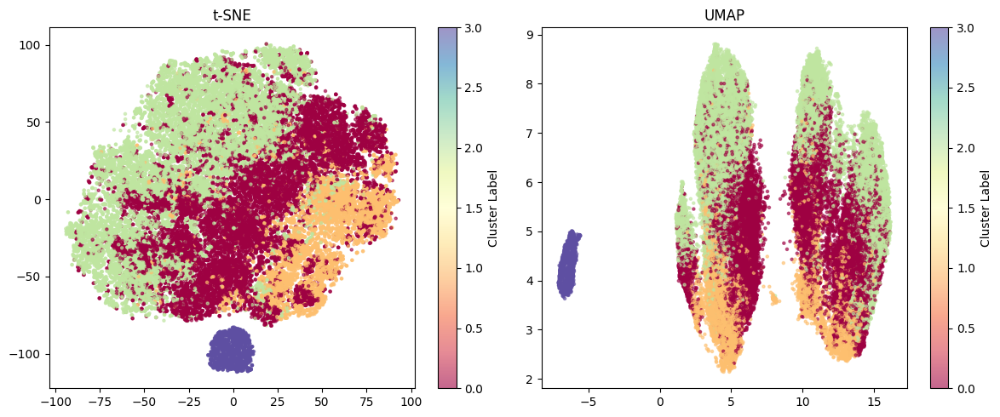

In [71]:
agglomerative2 = AgglomerativeClustering(n_clusters=4, linkage='ward').fit(X)
labels_agglomerative2 = agglomerative2.labels_
labels_dict['agglomerative2'] = labels_agglomerative2
plot_tsne_umap_clusters(X_tsne, X_umap, labels_agglomerative2)

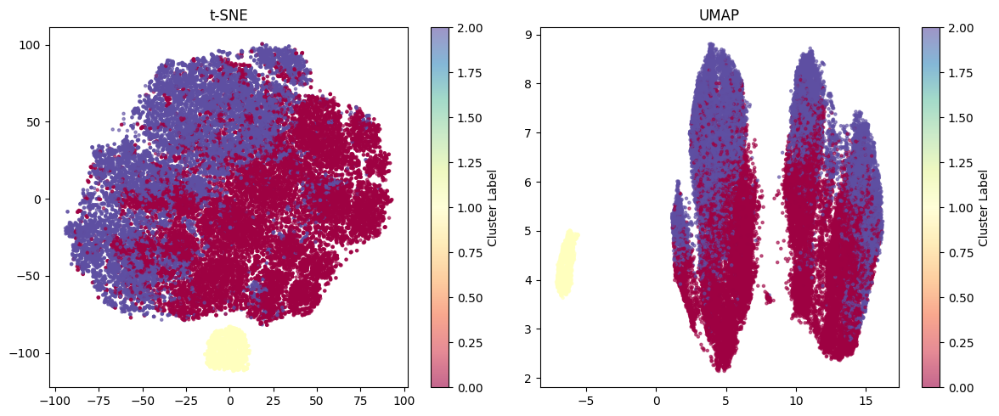

In [72]:
agglomerative3 = AgglomerativeClustering(n_clusters=3, linkage='ward').fit(X)
labels_agglomerative3 = agglomerative3.labels_
labels_dict['agglomerative3'] = labels_agglomerative3
plot_tsne_umap_clusters(X_tsne, X_umap, labels_agglomerative3)

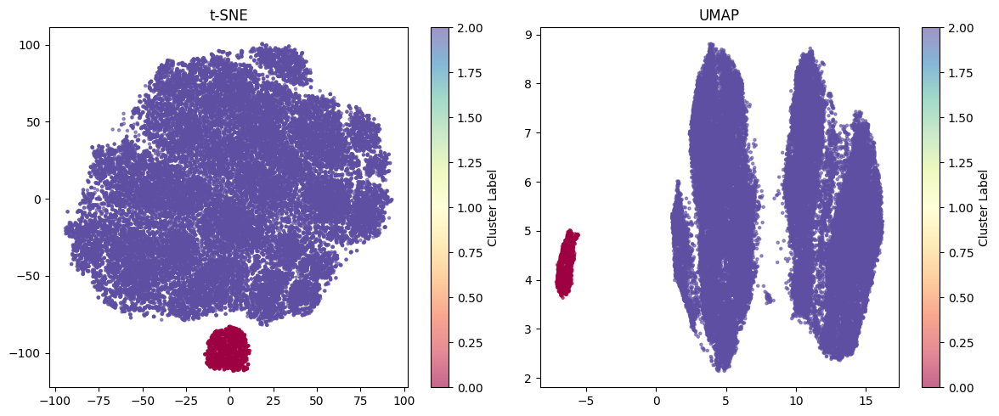

In [73]:
agglomerative4 = AgglomerativeClustering(n_clusters=3, linkage='average').fit(X)
labels_agglomerative4 = agglomerative4.labels_
labels_dict['agglomerative4'] = labels_agglomerative4
plot_tsne_umap_clusters(X_tsne, X_umap, labels_agglomerative4)

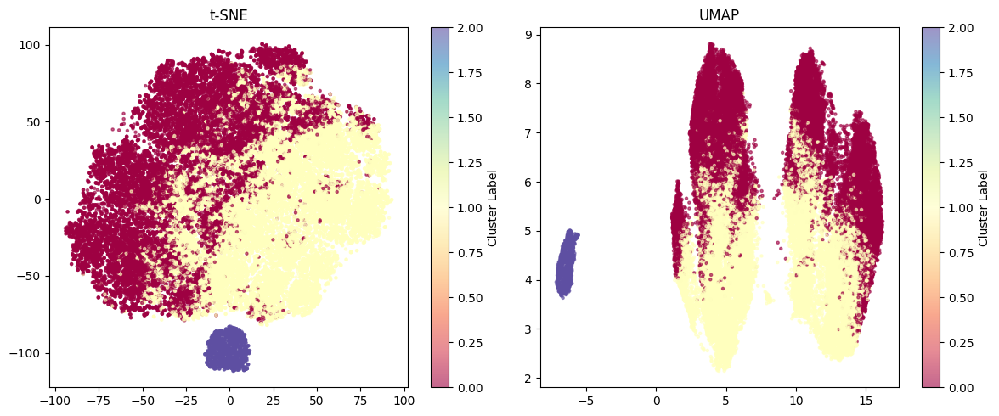

In [74]:
gaussian1 = GaussianMixture(n_components = 3, covariance_type='spherical', random_state=42).fit(X)
labels_gaussian1 = gaussian1.predict(X)
labels_dict['gaussian1'] = labels_gaussian1
plot_tsne_umap_clusters(X_tsne, X_umap, labels_gaussian1)

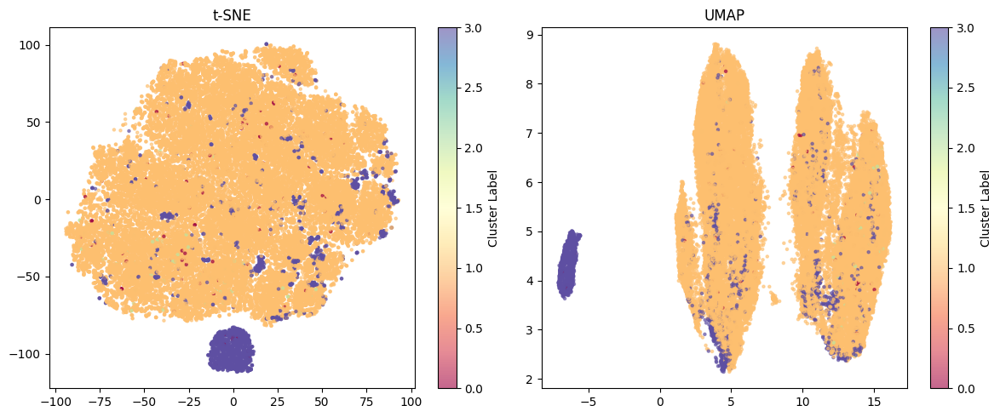

In [75]:
gaussian2 = GaussianMixture(n_components = 4, covariance_type='full', random_state=42).fit(X)
labels_gaussian2 = gaussian2.predict(X)
labels_dict['gaussian2'] = labels_gaussian2
plot_tsne_umap_clusters(X_tsne, X_umap, labels_gaussian2)

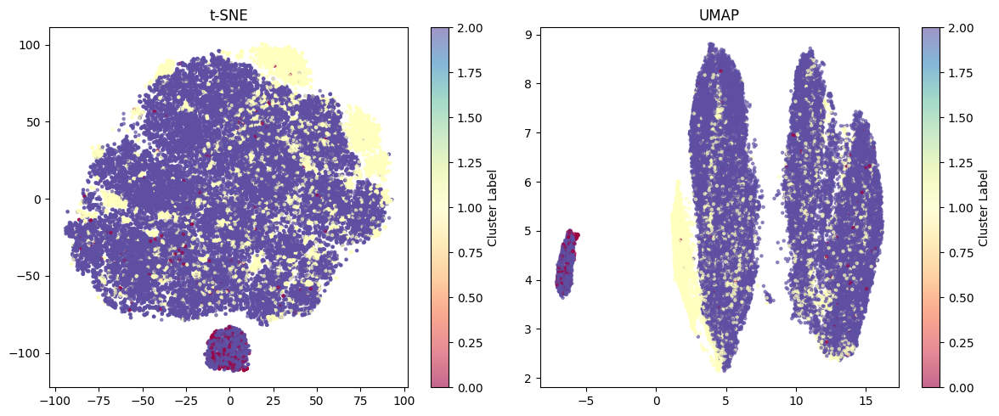

In [76]:
gaussian3 = GaussianMixture(n_components = 3, covariance_type='diag', random_state=42).fit(X)
labels_gaussian3 = gaussian3.predict(X)
labels_dict['gaussian3'] = labels_gaussian3
plot_tsne_umap_clusters(X_tsne, X_umap, labels_gaussian3)

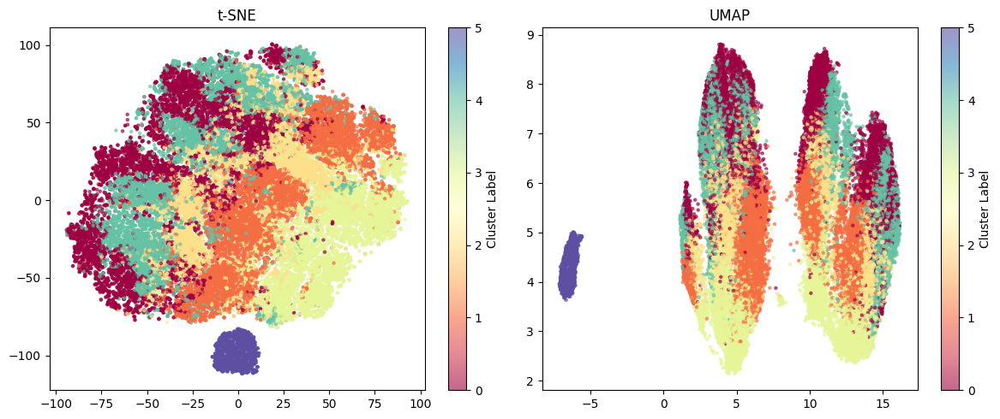

In [77]:
gaussian4 = GaussianMixture(n_components = 6, covariance_type='spherical', random_state=42).fit(X)
labels_gaussian4 = gaussian4.predict(X)
labels_dict['gaussian4'] = labels_gaussian4
plot_tsne_umap_clusters(X_tsne, X_umap, labels_gaussian4)

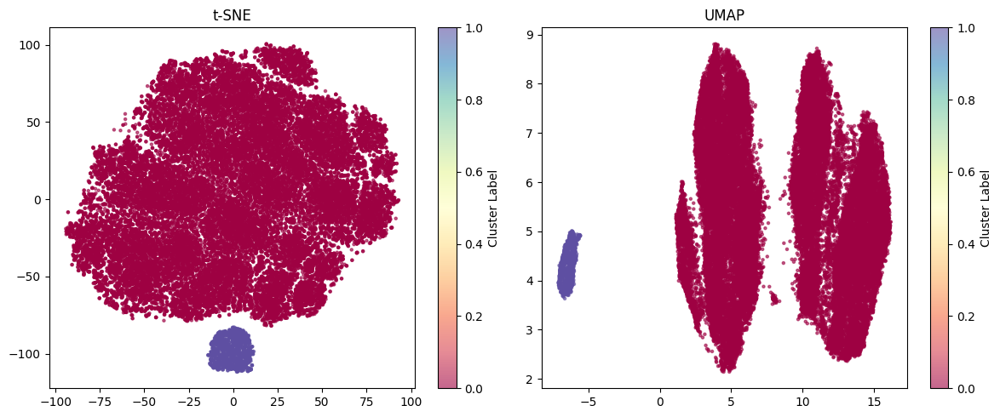

In [78]:
dbscan1 = DBSCAN(eps=5.0, min_samples=10) 
labels_dbscan1 = dbscan1.fit_predict(X)
labels_dict['dbscan1'] = labels_dbscan1
plot_tsne_umap_clusters(X_tsne, X_umap, labels_dbscan1)

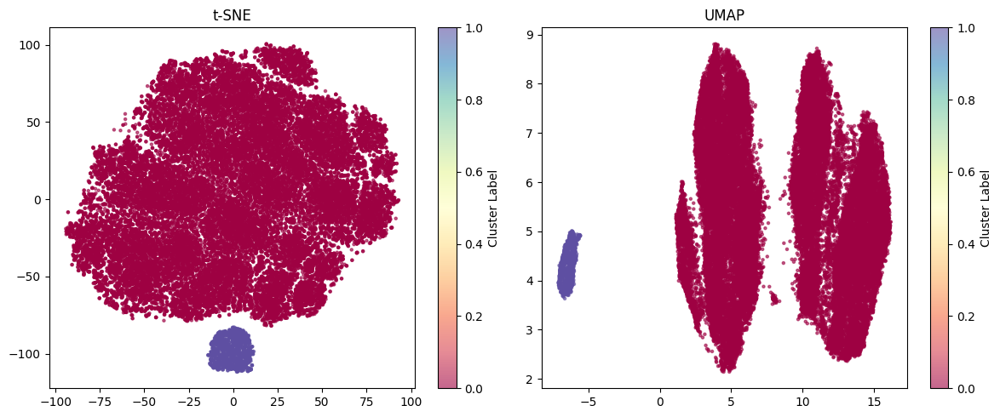

In [79]:
dbscan2 = DBSCAN(eps=5.0, min_samples=3) 
labels_dbscan2 = dbscan2.fit_predict(X)
labels_dict['dbscan2'] = labels_dbscan2
plot_tsne_umap_clusters(X_tsne, X_umap, labels_dbscan2)

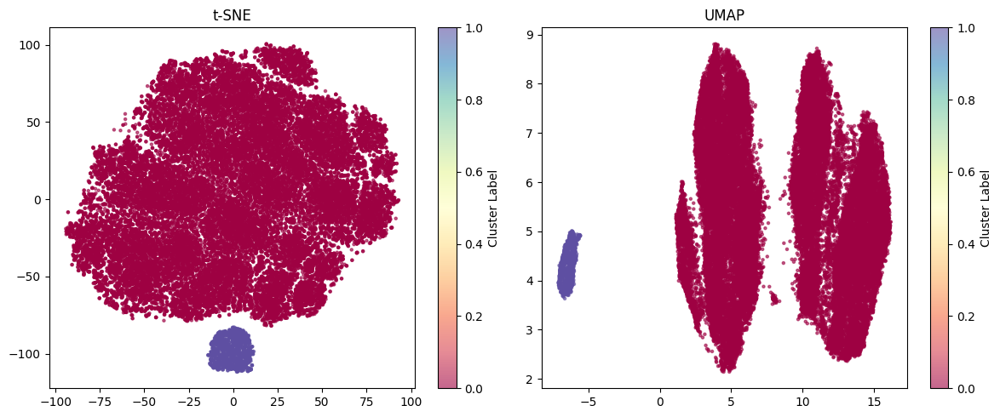

In [80]:
dbscan3 = DBSCAN(eps=5.0, min_samples=5) 
labels_dbscan3 = dbscan3.fit_predict(X)
labels_dict['dbscan3'] = labels_dbscan3
plot_tsne_umap_clusters(X_tsne, X_umap, labels_dbscan3)

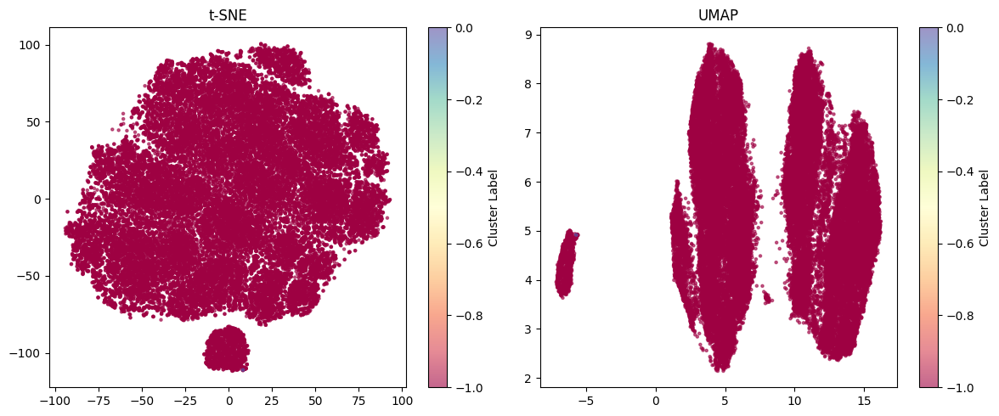

In [81]:
dbscan4 = DBSCAN(eps=0.3, min_samples=3) 
labels_dbscan4 = dbscan4.fit_predict(X)
labels_dict['dbscan4'] = labels_dbscan4
plot_tsne_umap_clusters(X_tsne, X_umap, labels_dbscan4)

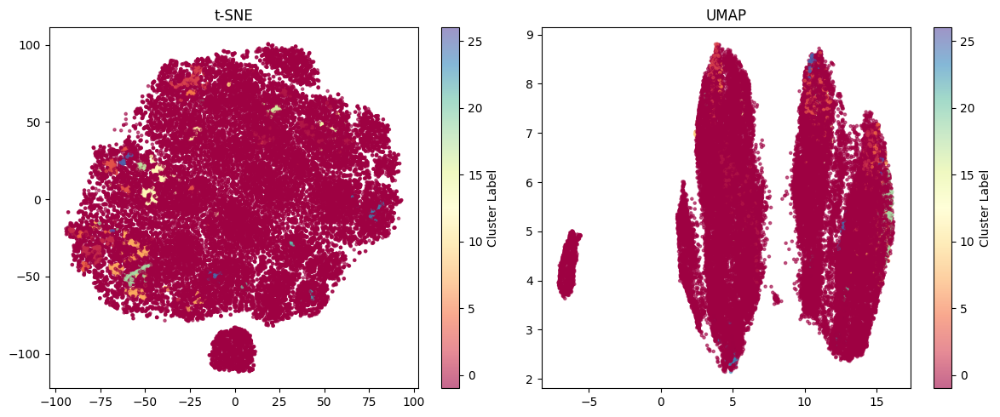

In [82]:
optics1 = OPTICS(max_eps=1, min_samples=10)
labels_optics1 = optics1.fit_predict(X)
plot_tsne_umap_clusters(X_tsne, X_umap, labels_optics1)

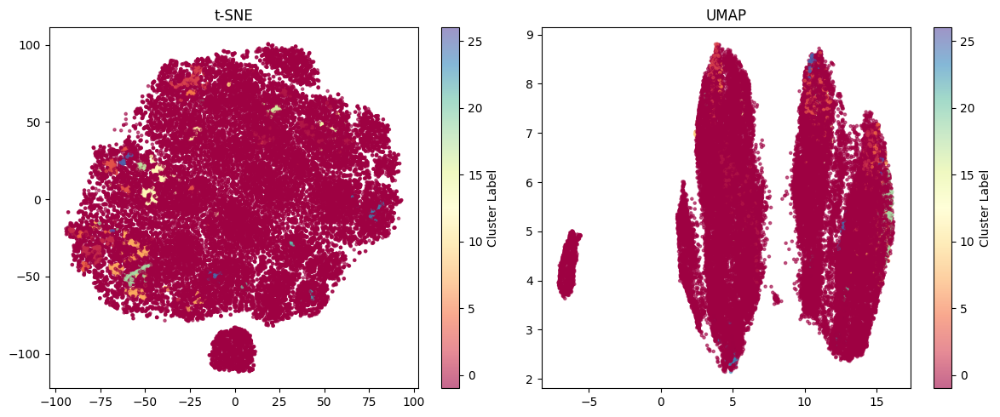

In [83]:
optics2 = OPTICS(max_eps=1.0, min_samples=10)
labels_optics2 = optics2.fit_predict(X)
plot_tsne_umap_clusters(X_tsne, X_umap, labels_optics2)

# Interpretowalność

In [84]:
def cpu_cluster_interpret(X, labels_dict, n_samples=5000, random_state=42):
    """
    CPU-based clustering interpretability analysis using SHAP
    
    Parameters:
        X (pd.DataFrame/np.ndarray): Input features
        labels_dict (dict): Dictionary of {model_name: cluster_labels}
        n_samples (int): Number of samples for SHAP analysis
        random_state (int): Reproducibility seed
    
    Returns:
        dict: SHAP values and feature importances for each clustering
    """
    # Convert to pandas DataFrame if not already
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X)
    
    results = {}
    
    for name, labels in labels_dict.items():
        # Encode labels if needed
        le = LabelEncoder()
        encoded_labels = le.fit_transform(labels)
        
        # Subsample data
        if len(X) > n_samples:
            sample_idx = np.random.choice(len(X), n_samples, replace=False)
            X_sample = X.iloc[sample_idx]
            labels_sample = encoded_labels[sample_idx]
        else:
            X_sample = X
            labels_sample = encoded_labels
        
        # Train CPU RandomForest
        clf = RandomForestClassifier(n_estimators=100, 
                                   random_state=random_state,
                                   n_jobs=-1)  # Use all CPU cores
        clf.fit(X_sample, labels_sample)
        
        # Calculate SHAP values
        explainer = shap.TreeExplainer(clf)
        shap_values = explainer.shap_values(X_sample)
        
        # Calculate feature importance
        if isinstance(shap_values, list):
            feature_importance = np.mean([np.abs(v).mean(0) for v in shap_values], 0)
        else:
            feature_importance = np.abs(shap_values).mean(0)
        
        results[name] = {
            'shap_values': shap_values,
            'feature_importance': feature_importance,
            'features': X.columns.tolist()
        }
    
    return results


In [85]:
def plot_feature_importance(results):
    for model_name, data in results.items():
        features = data['features']
        importance = np.array(data['feature_importance']).flatten()
        
        # Ensure lengths match
        min_len = min(len(features), len(importance))
        features = features[:min_len]
        importance = importance[:min_len]
        
        # Sort features by importance (descending)
        sorted_idx = importance.argsort()[::-1]
        sorted_features = [features[i] for i in sorted_idx]
        sorted_importance = importance[sorted_idx]
        
        plt.figure(figsize=(10, 6))
        plt.barh(sorted_features, sorted_importance, color='skyblue')
        plt.xlabel('Mean Absolute SHAP Value')
        plt.title(f'Feature Importance for {model_name}')
        plt.gca().invert_yaxis()  # Highest importance on top
        plt.tight_layout()
        plt.show()

In [86]:
results1 = cpu_cluster_interpret(X, labels_dict, n_samples=2000, random_state=42)

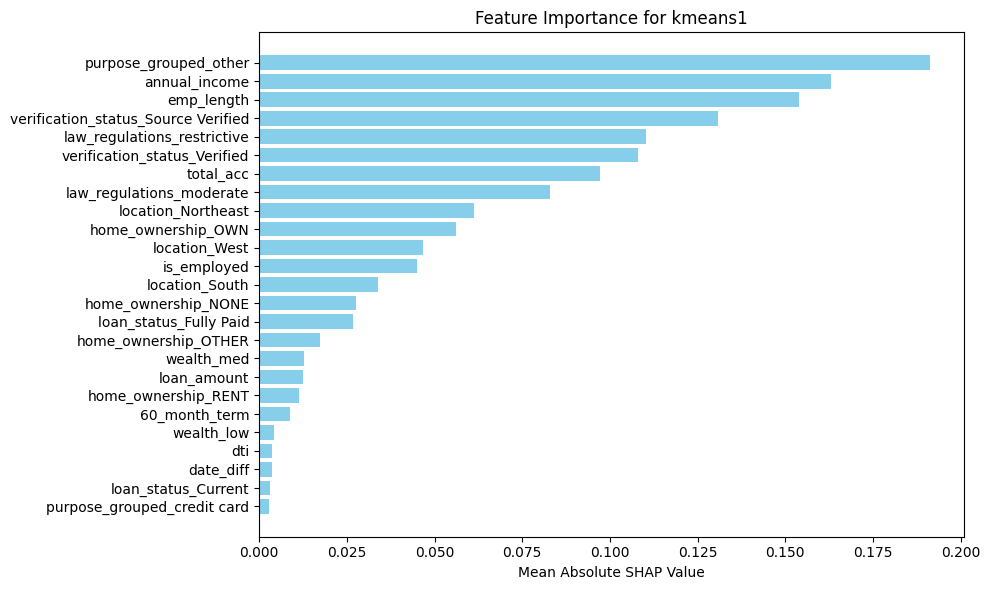

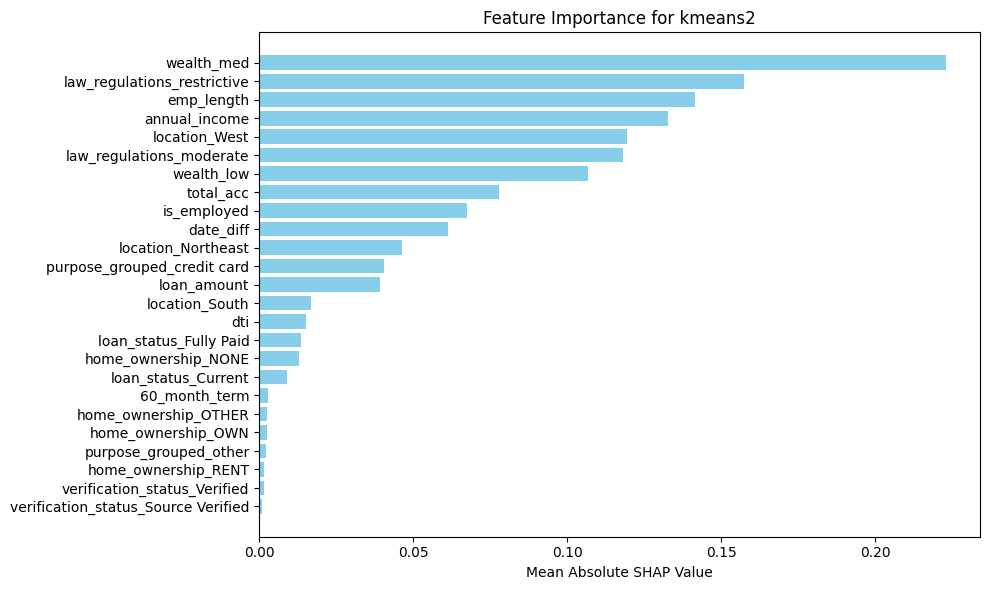

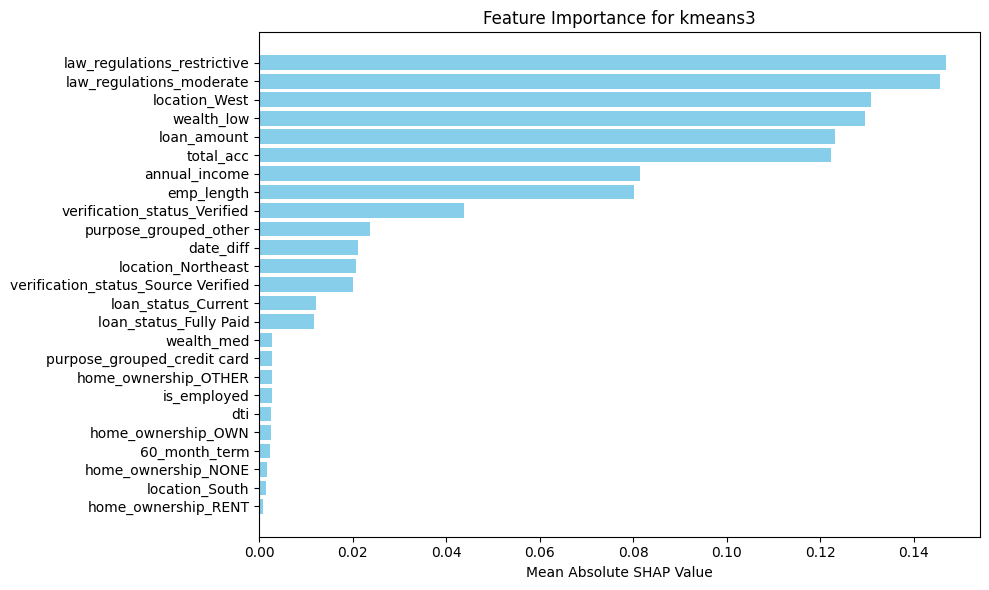

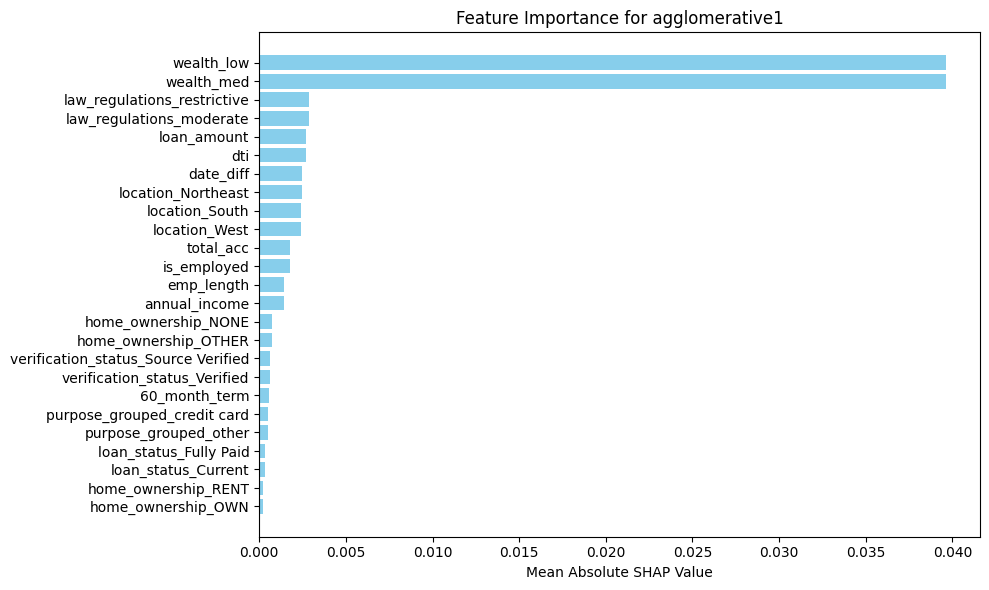

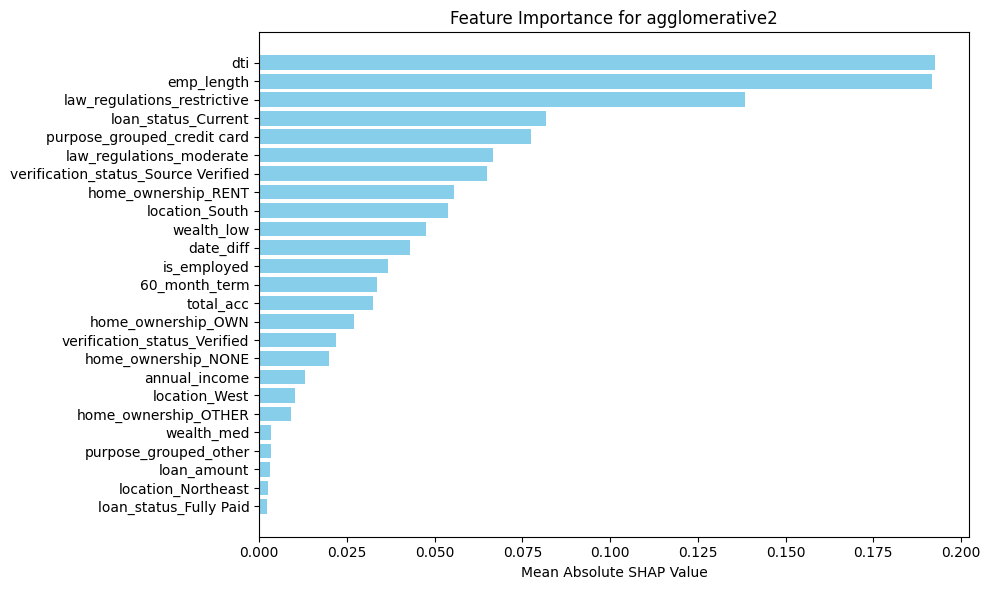

...

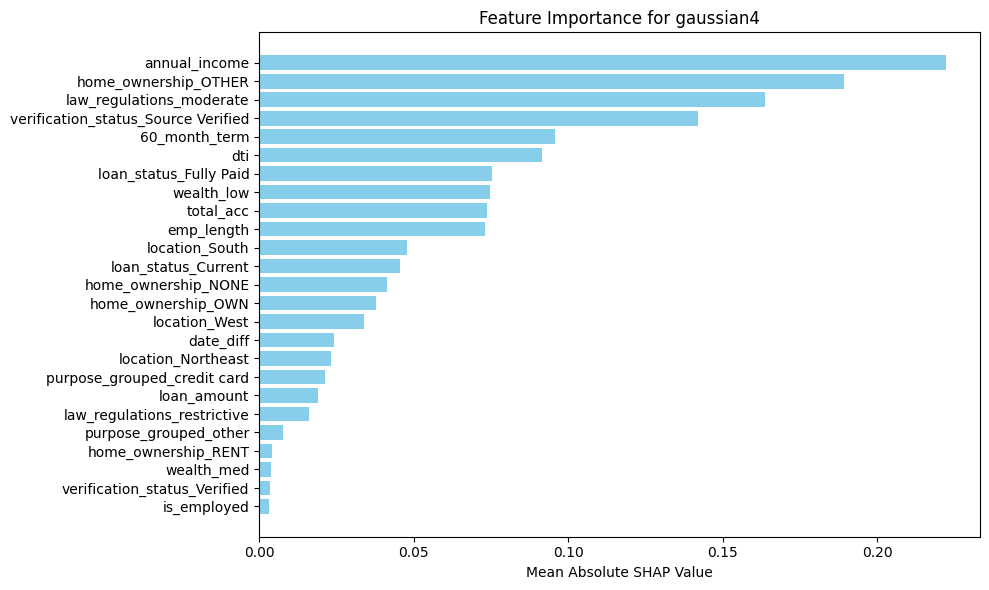

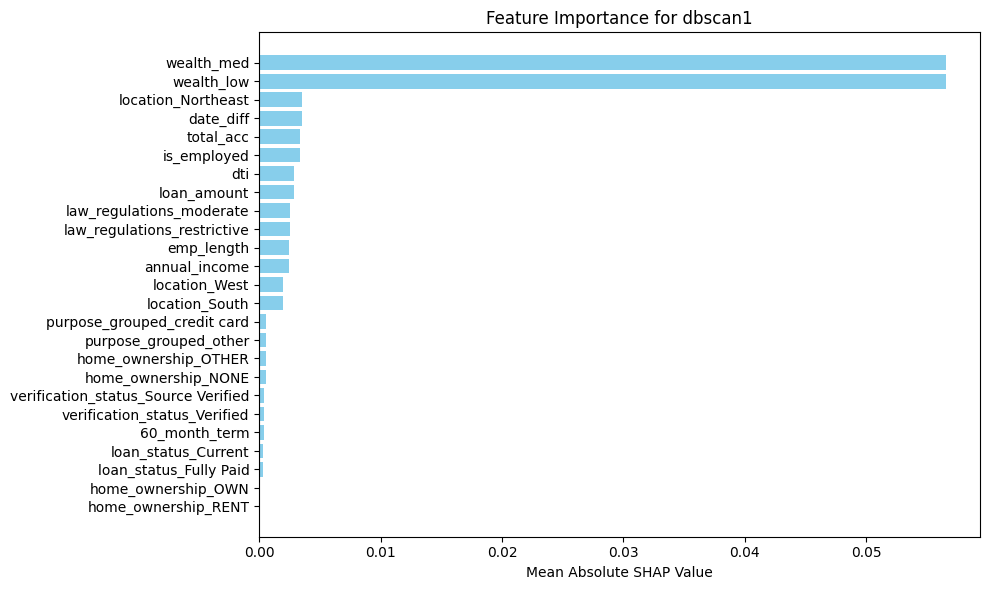

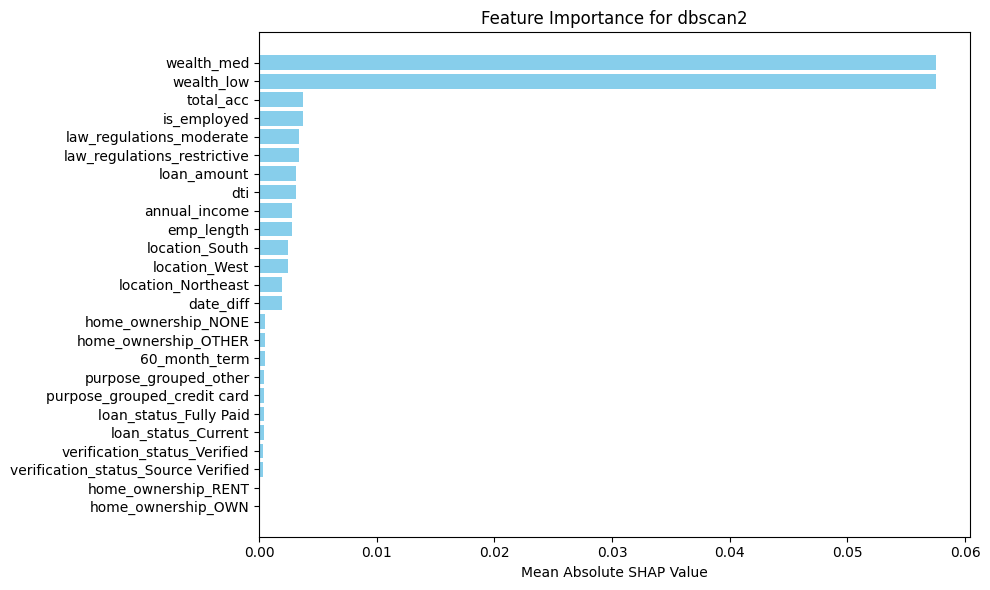

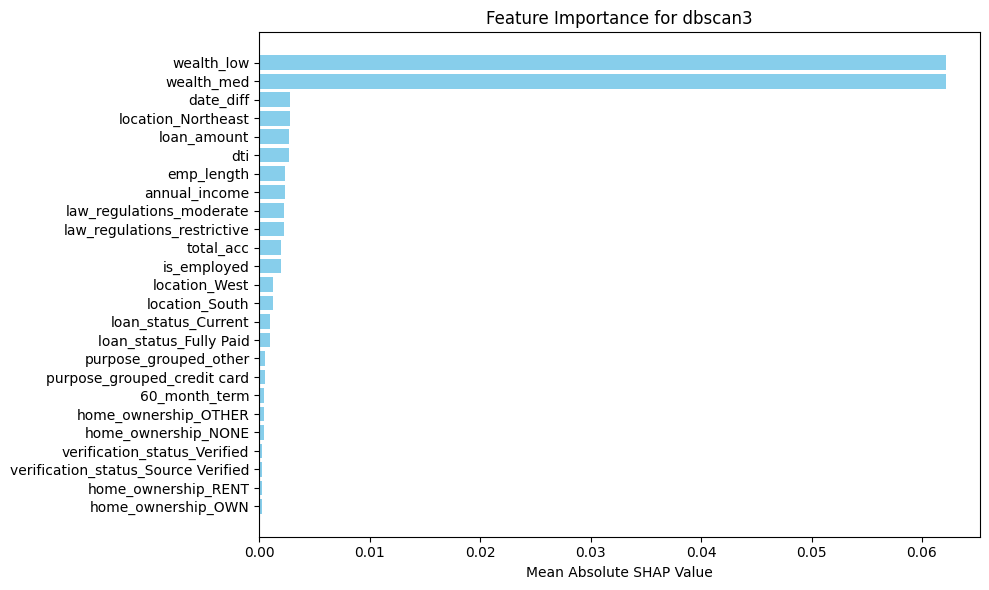

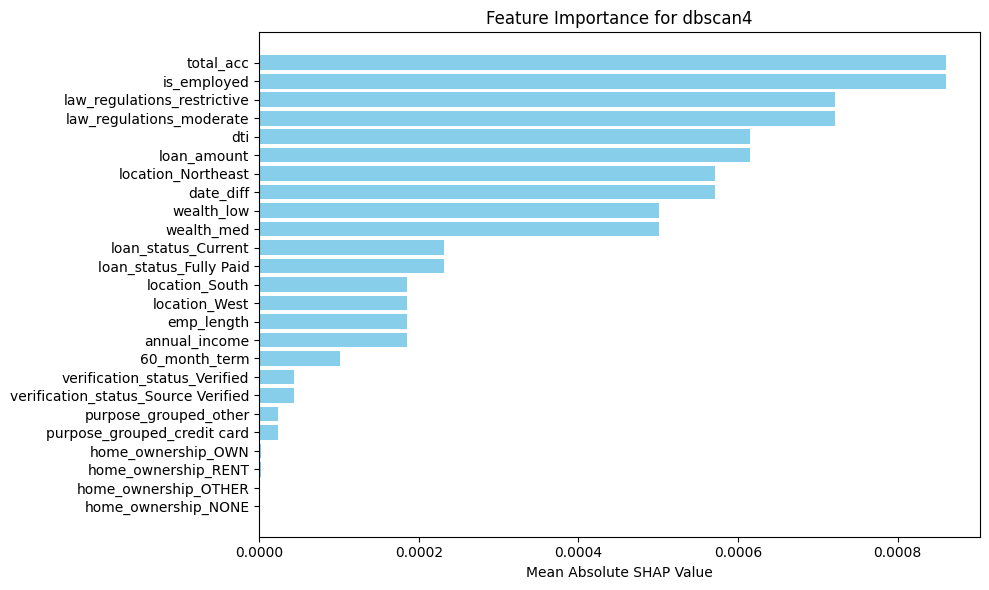

In [87]:
plot_feature_importance(results1)

# Analiza wrażliwości cech dla różnych klastrów

## GMM

In [35]:
data['cluster'] = labels_dict['gaussian1']

In [36]:
def sensitivity_analysis(model, data, cluster_col='cluster', n_samples=2, epsilon=0.1):
    """
    Dla każdego klastra wybiera n_samples rekordów i wykonuje analizę wrażliwości cech
    (sensitivity analysis) dla każdego z nich, tworząc osobny wykres.
    
    Parametry:
    - model: wytrenowany model klasteryzujący (np. GaussianMixture, KMeans)
    - data: DataFrame zawierający dane i kolumnę z etykietami klastrów
    - cluster_col: nazwa kolumny z etykietami klastrów
    - n_samples: liczba rekordów do pobrania z każdego klastra (domyślnie 2)
    - epsilon: wielkość perturbacji cechy (domyślnie 0.1)
    """
    feature_names = [col for col in data.columns if col != cluster_col]
    selected_indices = []
    for cluster_id in data[cluster_col].unique():
        cluster_data = data[data[cluster_col] == cluster_id]
        if len(cluster_data) >= n_samples:
            sampled = cluster_data.sample(n=n_samples, random_state=42)
            selected_indices.extend(sampled.index.tolist())
        else:
            selected_indices.extend(cluster_data.index.tolist())
    
    for idx in selected_indices:
        record = data.loc[idx, feature_names].values
        probs = model.predict_proba(record.reshape(1, -1))[0]
        assigned_cluster = np.argmax(probs)
        sensitivity = []
        for i in range(len(record)):
            perturbed = record.copy()
            perturbed[i] += epsilon * np.std(model.means_[:, i])
            perturbed_probs = model.predict_proba(perturbed.reshape(1, -1))[0]
            delta = np.abs(perturbed_probs[assigned_cluster] - probs[assigned_cluster])
            sensitivity.append(delta)
        sensitivity = np.array(sensitivity)
        sensitivity_norm = sensitivity / sensitivity.sum() if sensitivity.sum() > 0 else sensitivity
        plt.figure(figsize=(10, 6))
        plt.bar(feature_names, sensitivity_norm, color='salmon')
        plt.title(f'Record {idx} (orig cluster: {data.loc[idx, cluster_col]}) - Assigned: {assigned_cluster}')
        plt.xlabel('Feature')
        plt.ylabel('Normalized Sensitivity')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
        print(f"Record {idx}: Assigned cluster {assigned_cluster}, Original cluster: {data.loc[idx, cluster_col]}")
        print(f"Cluster probabilities: {probs}\n{'-'*60}")


In [94]:
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cdist

def sensitivity_analysis_agglomerative(model, data, cluster_col='cluster', n_samples=2, epsilon=0.1):
    """
    Analiza wrażliwości dla agglomerative clustering.
    Używa odległości do centrów klastrów jako podstawy analizy.
    
    Parametry:
    - model: wytrenowany model AgglomerativeClustering
    - data: DataFrame zawierający dane i kolumnę z etykietami klastrów  
    - cluster_col: nazwa kolumny z etykietami klastrów
    - n_samples: liczba rekordów do pobrania z każdego klastra
    - epsilon: wielkość perturbacji cechy
    """
    feature_names = [col for col in data.columns if col != cluster_col]
    X = data[feature_names].values
    labels = data[cluster_col].values
    
    # Oblicz centroidy klastrów (ręcznie, bo AgglomerativeClustering ich nie ma)
    unique_labels = np.unique(labels)
    centroids = {}
    for label in unique_labels:
        mask = labels == label
        centroids[label] = np.mean(X[mask], axis=0)
    
    # Wybierz rekordy z każdego klastra
    selected_indices = []
    for cluster_id in unique_labels:
        cluster_data = data[data[cluster_col] == cluster_id]
        if len(cluster_data) >= n_samples:
            sampled = cluster_data.sample(n=n_samples, random_state=42)
            selected_indices.extend(sampled.index.tolist())
        else:
            selected_indices.extend(cluster_data.index.tolist())
    
    for idx in selected_indices:
        record = data.loc[idx, feature_names].values
        original_cluster = data.loc[idx, cluster_col]
        
        # Oblicz odległości do wszystkich centrów klastrów
        distances_to_centroids = {}
        for label in unique_labels:
            dist = np.linalg.norm(record - centroids[label])
            distances_to_centroids[label] = dist
        
        # Znajdź najbliższy klaster (assigned cluster)
        assigned_cluster = min(distances_to_centroids, key=distances_to_centroids.get)
        
        # Konwertuj odległości na "prawdopodobieństwa" (odwrotność znormalizowanych odległości)
        max_dist = max(distances_to_centroids.values())
        pseudo_probs = {}
        for label, dist in distances_to_centroids.items():
            # Im mniejsza odległość, tym wyższe "prawdopodobieństwo"
            pseudo_probs[label] = (max_dist - dist) / max_dist if max_dist > 0 else 1.0
        
        # Normalizuj "prawdopodobieństwa"
        total_prob = sum(pseudo_probs.values())
        if total_prob > 0:
            for label in pseudo_probs:
                pseudo_probs[label] /= total_prob
        
        # Analiza sensitivity
        sensitivity = []
        baseline_prob = pseudo_probs[assigned_cluster]
        
        for i in range(len(record)):
            perturbed = record.copy()
            # Użyj odchylenia standardowego cechy w całym zbiorze danych
            feature_std = np.std(X[:, i])
            perturbed[i] += epsilon * feature_std
            
            # Oblicz nowe odległości po perturbacji
            perturbed_distances = {}
            for label in unique_labels:
                dist = np.linalg.norm(perturbed - centroids[label])
                perturbed_distances[label] = dist
            
            # Konwertuj na "prawdopodobieństwa"
            max_dist_perturbed = max(perturbed_distances.values())
            perturbed_pseudo_probs = {}
            for label, dist in perturbed_distances.items():
                perturbed_pseudo_probs[label] = (max_dist_perturbed - dist) / max_dist_perturbed if max_dist_perturbed > 0 else 1.0
            
            # Normalizuj
            total_prob_perturbed = sum(perturbed_pseudo_probs.values())
            if total_prob_perturbed > 0:
                for label in perturbed_pseudo_probs:
                    perturbed_pseudo_probs[label] /= total_prob_perturbed
            
            # Oblicz zmianę w "prawdopodobieństwie" dla assigned cluster
            new_prob = perturbed_pseudo_probs[assigned_cluster]
            delta = np.abs(new_prob - baseline_prob)
            sensitivity.append(delta)
        
        # Normalizuj sensitivity
        sensitivity = np.array(sensitivity)
        sensitivity_norm = sensitivity / sensitivity.sum() if sensitivity.sum() > 0 else np.ones_like(sensitivity) / len(sensitivity)
        
        # Wykres
        plt.figure(figsize=(12, 7))
        bars = plt.bar(range(len(feature_names)), sensitivity_norm, 
                      color='lightblue', edgecolor='navy', linewidth=0.5, alpha=0.8)
        plt.xticks(range(len(feature_names)), feature_names, rotation=45, ha='right')
        plt.ylabel('Normalized Sensitivity')
        plt.title(f'Agglomerative - Record {idx} (orig: {original_cluster}, assigned: {assigned_cluster})')
        plt.ylim(0, max(0.1, max(sensitivity_norm) * 1.1))
        plt.tight_layout()
        plt.show()
        
        print(f"Record {idx}: Assigned cluster {assigned_cluster}, Original cluster: {original_cluster}")
        print(f"Pseudo-probabilities: {[f'{k}: {v:.3f}' for k, v in pseudo_probs.items()]}")
        print(f"Distances to centroids: {[f'{k}: {v:.3f}' for k, v in distances_to_centroids.items()]}")
        print('-' * 60)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

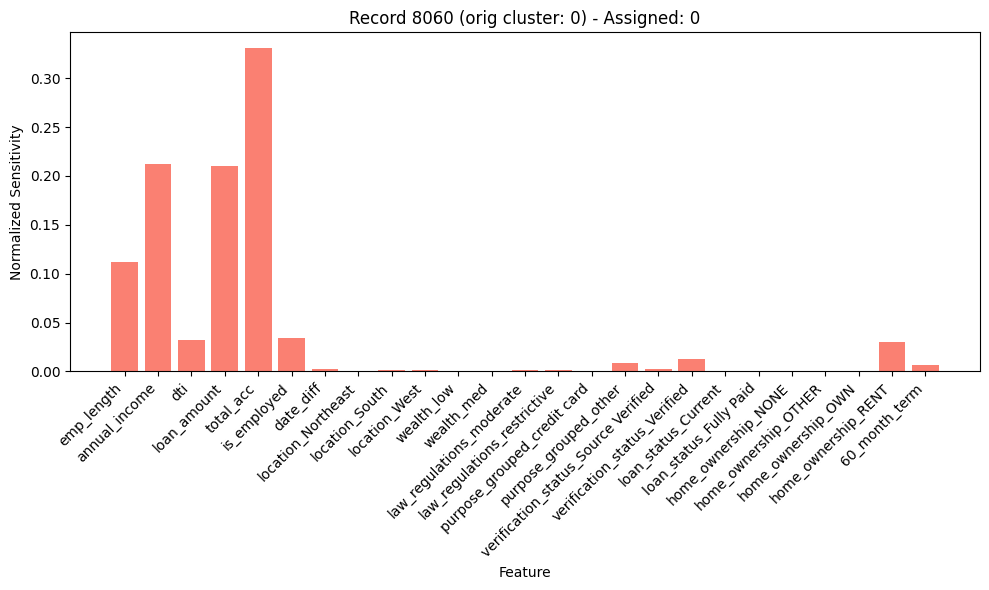

Record 8060: Assigned cluster 0, Original cluster: 0
Cluster probabilities: [9.98710773e-01 1.28922656e-03 4.63701490e-19]
------------------------------------------------------------


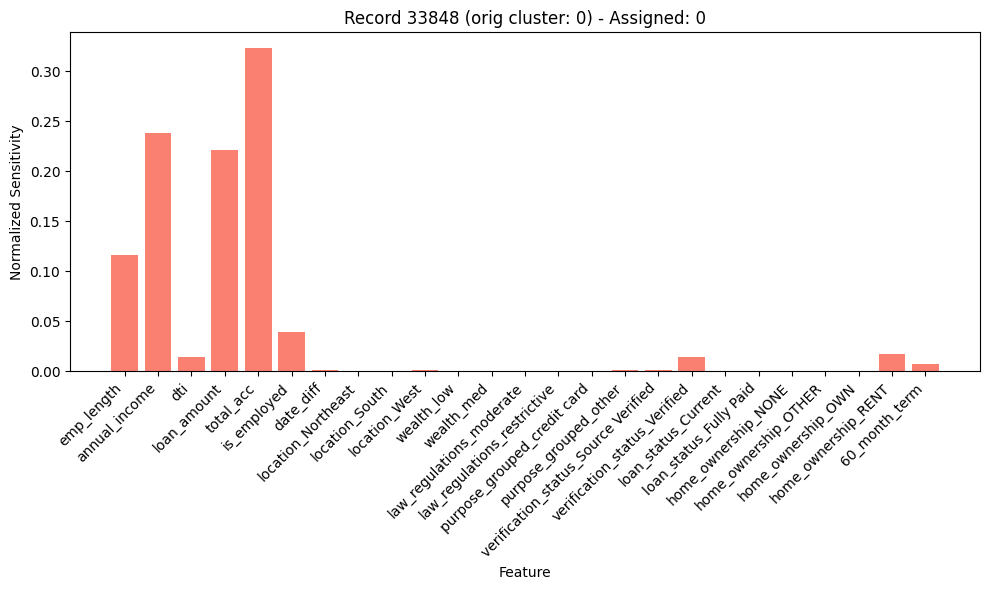

Record 33848: Assigned cluster 0, Original cluster: 0
Cluster probabilities: [9.99999699e-01 3.01088290e-07 4.44988298e-20]
------------------------------------------------------------


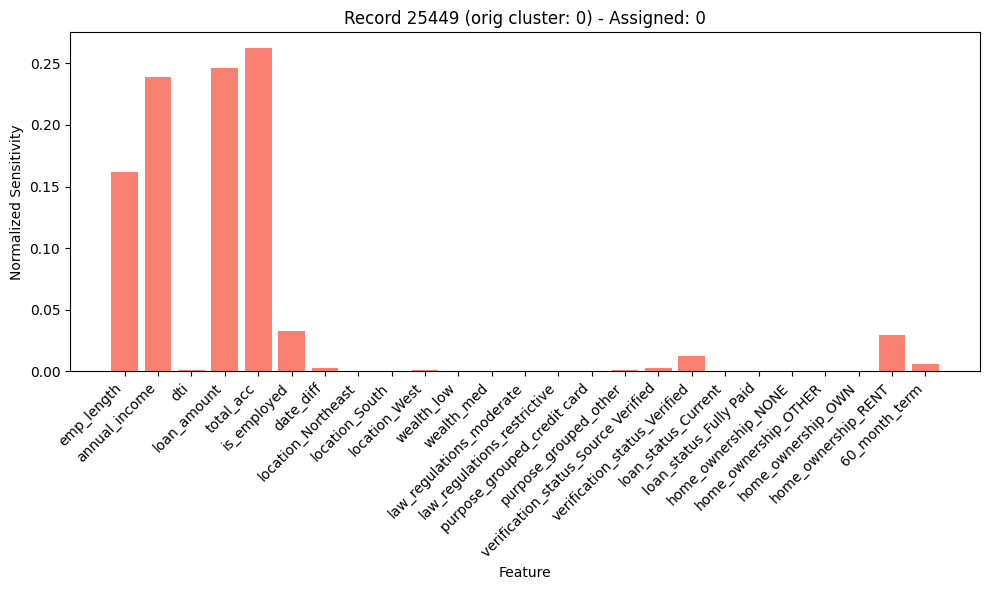

Record 25449: Assigned cluster 0, Original cluster: 0
Cluster probabilities: [9.20166361e-01 7.98336389e-02 2.60078804e-17]
------------------------------------------------------------


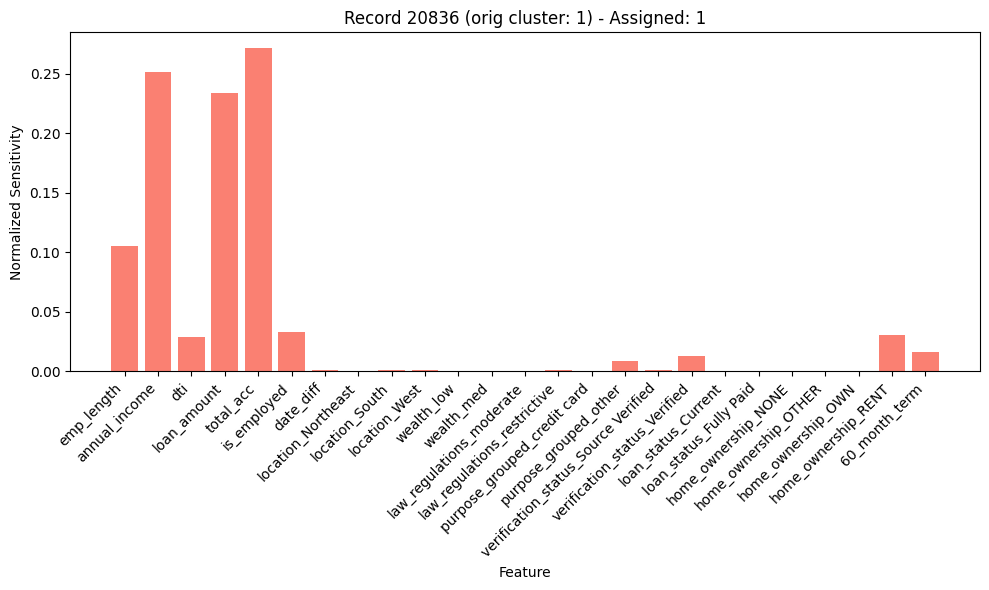

Record 20836: Assigned cluster 1, Original cluster: 1
Cluster probabilities: [4.93674918e-01 5.06325082e-01 1.60074773e-17]
------------------------------------------------------------


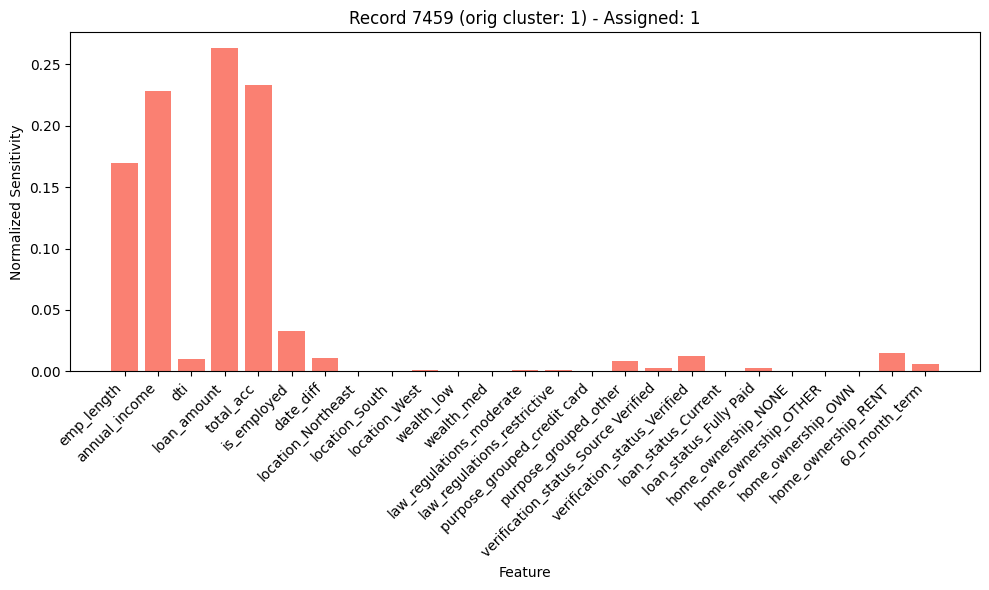

Record 7459: Assigned cluster 1, Original cluster: 1
Cluster probabilities: [7.11893741e-04 9.99288106e-01 3.68763043e-18]
------------------------------------------------------------


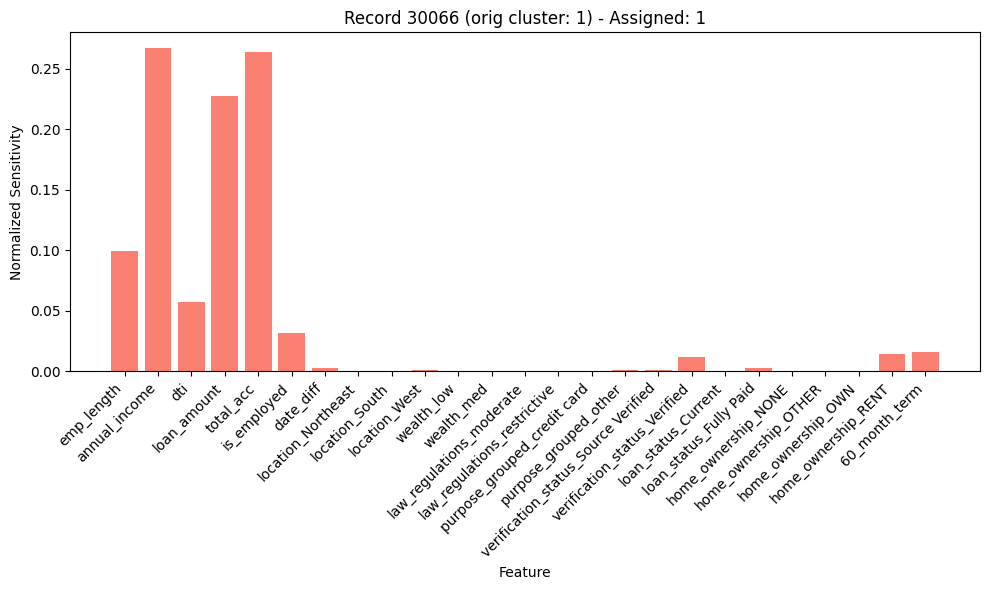

Record 30066: Assigned cluster 1, Original cluster: 1
Cluster probabilities: [2.66863381e-05 9.99973314e-01 1.76569581e-18]
------------------------------------------------------------


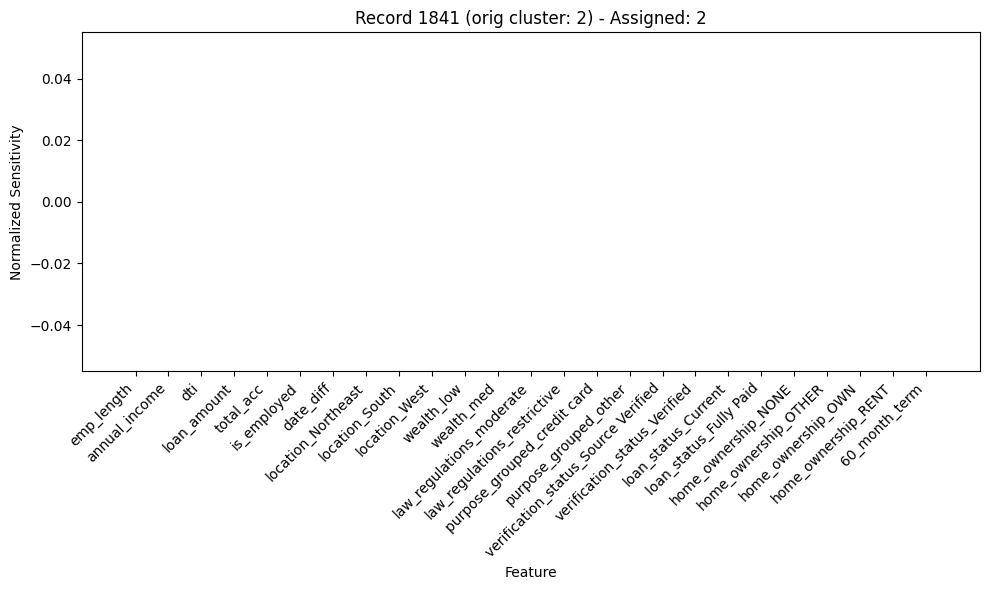

Record 1841: Assigned cluster 2, Original cluster: 2
Cluster probabilities: [3.83544008e-22 1.76568656e-20 1.00000000e+00]
------------------------------------------------------------


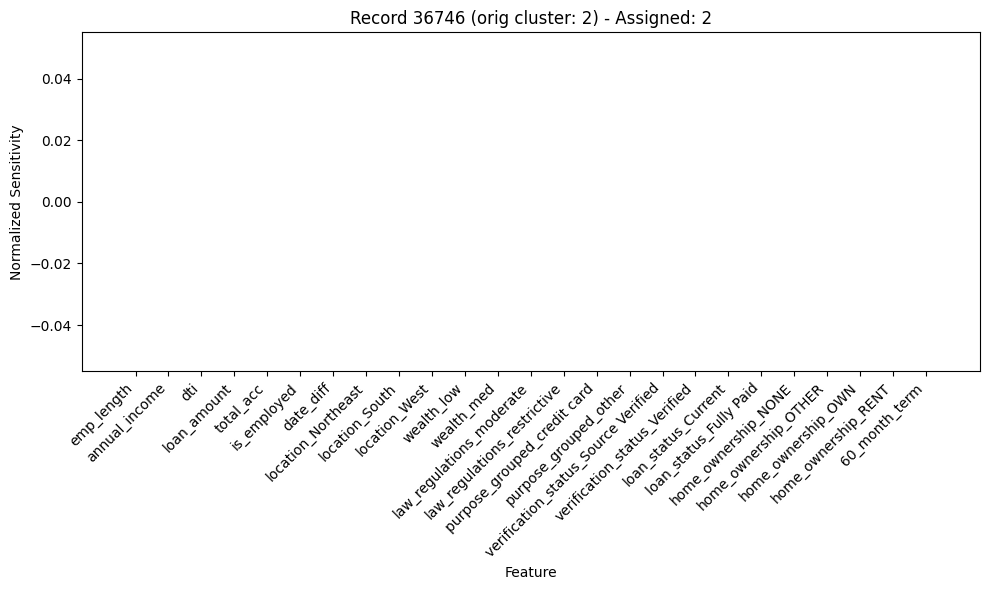

Record 36746: Assigned cluster 2, Original cluster: 2
Cluster probabilities: [3.49960601e-21 2.73445973e-20 1.00000000e+00]
------------------------------------------------------------


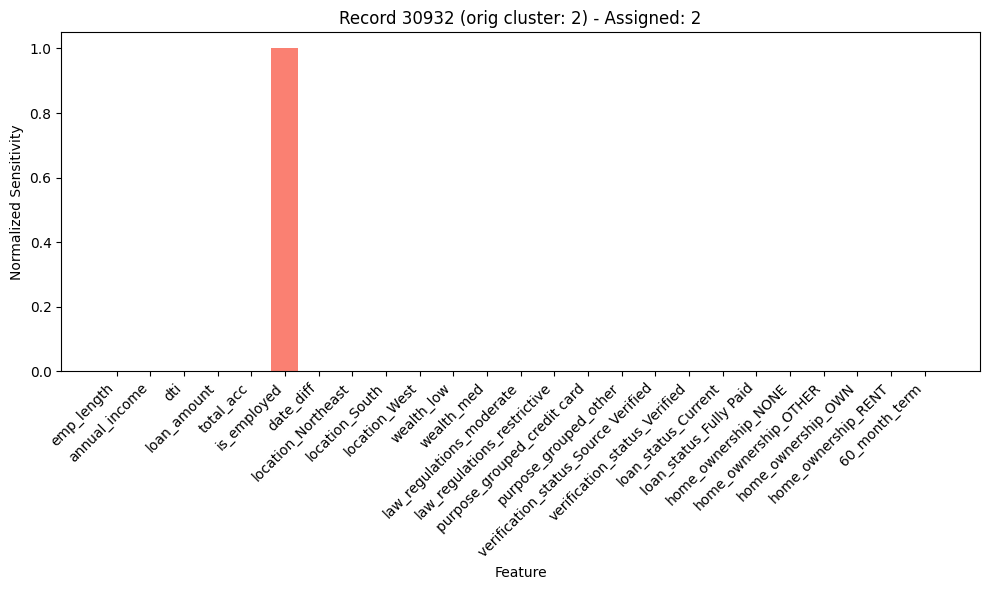

Record 30932: Assigned cluster 2, Original cluster: 2
Cluster probabilities: [9.50546801e-26 5.97233565e-17 1.00000000e+00]
------------------------------------------------------------


In [ ]:
sensitivity_analysis(gaussian1, data, cluster_col='cluster', n_samples=3)

## Agglo

In [ ]:
data2 = data
data2 = data.drop('cluster', axis=1)
data2['cluster'] = labels_dict['agglomerative2']

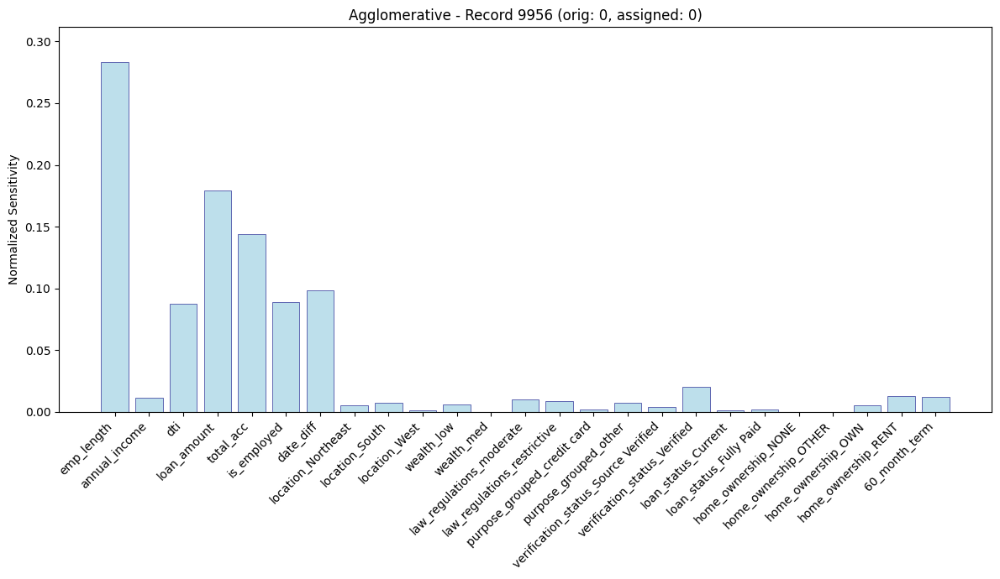

Record 9956: Assigned cluster 0, Original cluster: 0
Pseudo-probabilities: ['0: 0.362', '1: 0.284', '2: 0.355', '3: 0.000']
Distances to centroids: ['0: 2.192', '1: 2.938', '2: 2.257', '3: 5.645']
------------------------------------------------------------


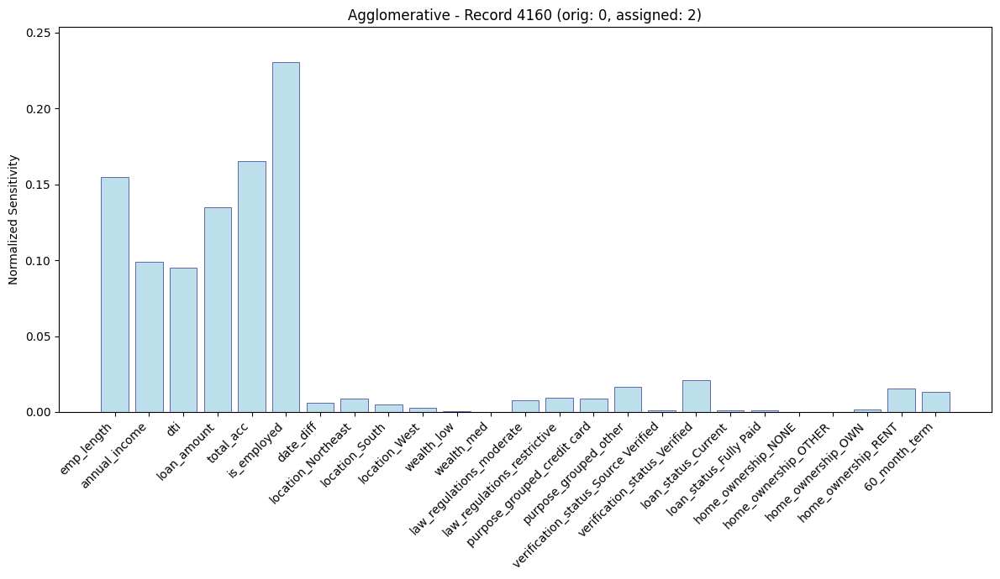

Record 4160: Assigned cluster 2, Original cluster: 0
Pseudo-probabilities: ['0: 0.356', '1: 0.191', '2: 0.452', '3: 0.000']
Distances to centroids: ['0: 3.512', '1: 4.792', '2: 2.769', '3: 6.279']
------------------------------------------------------------


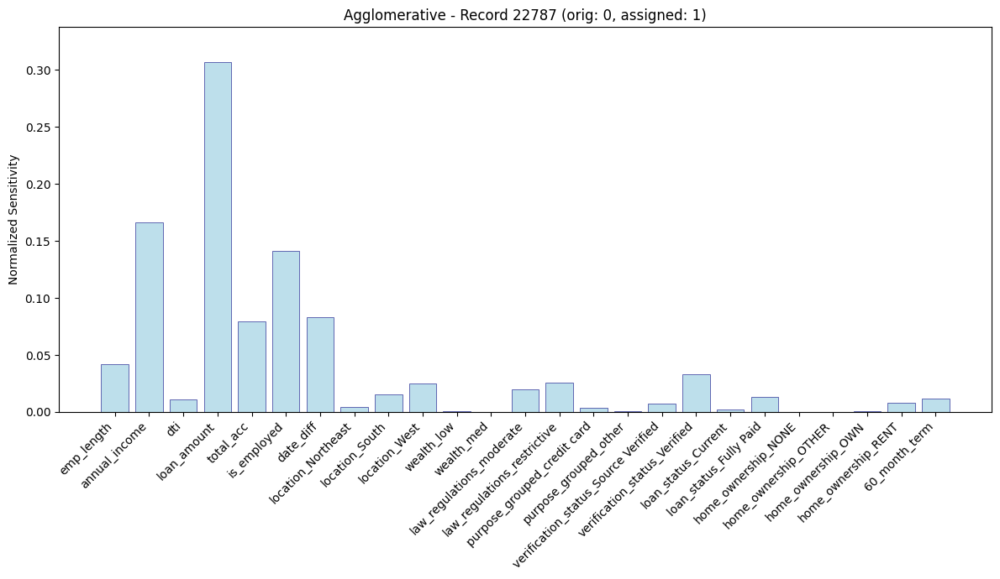

Record 22787: Assigned cluster 1, Original cluster: 0
Pseudo-probabilities: ['0: 0.349', '1: 0.415', '2: 0.236', '3: 0.000']
Distances to centroids: ['0: 2.360', '1: 1.681', '2: 3.510', '3: 5.918']
------------------------------------------------------------


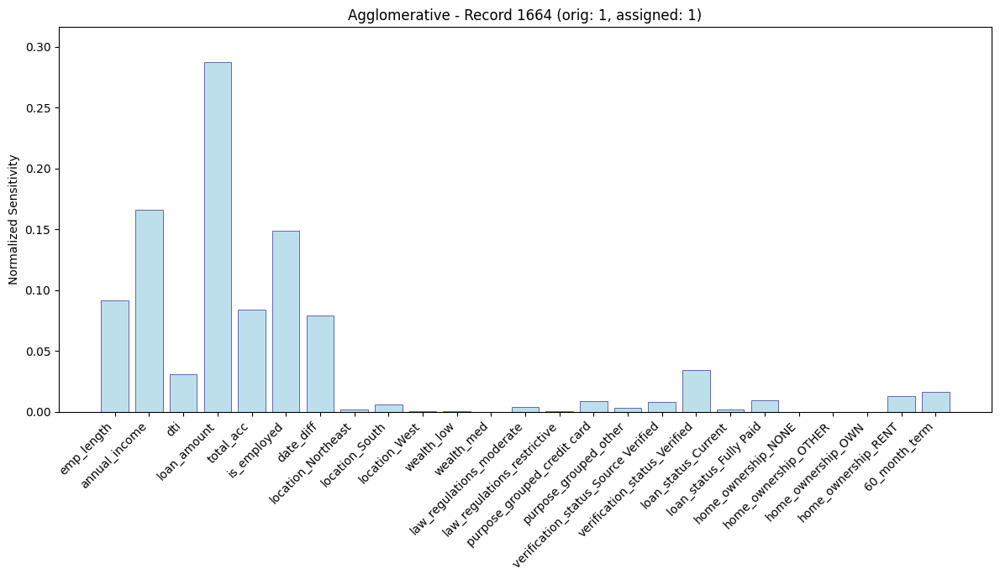

Record 1664: Assigned cluster 1, Original cluster: 1
Pseudo-probabilities: ['0: 0.296', '1: 0.409', '2: 0.295', '3: 0.000']
Distances to centroids: ['0: 3.412', '1: 2.398', '2: 3.428', '3: 6.071']
------------------------------------------------------------


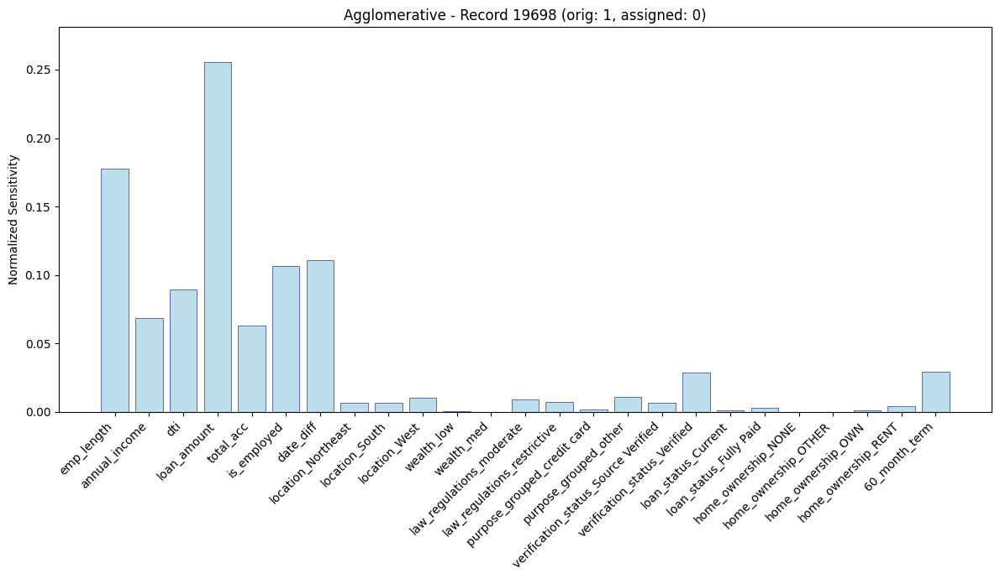

Record 19698: Assigned cluster 0, Original cluster: 1
Pseudo-probabilities: ['0: 0.370', '1: 0.358', '2: 0.272', '3: 0.000']
Distances to centroids: ['0: 2.337', '1: 2.455', '2: 3.273', '3: 5.877']
------------------------------------------------------------


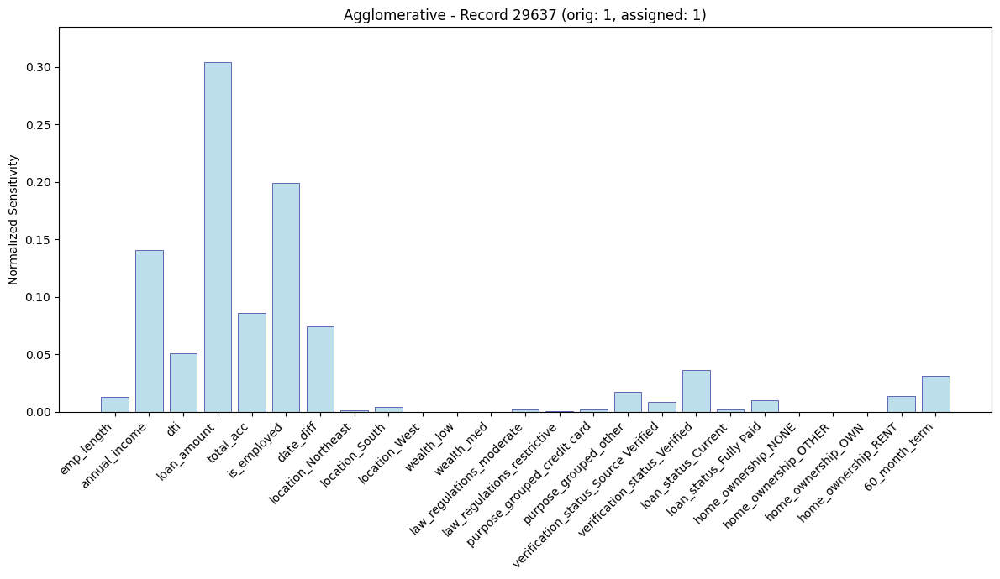

Record 29637: Assigned cluster 1, Original cluster: 1
Pseudo-probabilities: ['0: 0.339', '1: 0.423', '2: 0.238', '3: 0.000']
Distances to centroids: ['0: 3.438', '1: 2.732', '2: 4.296', '3: 6.301']
------------------------------------------------------------


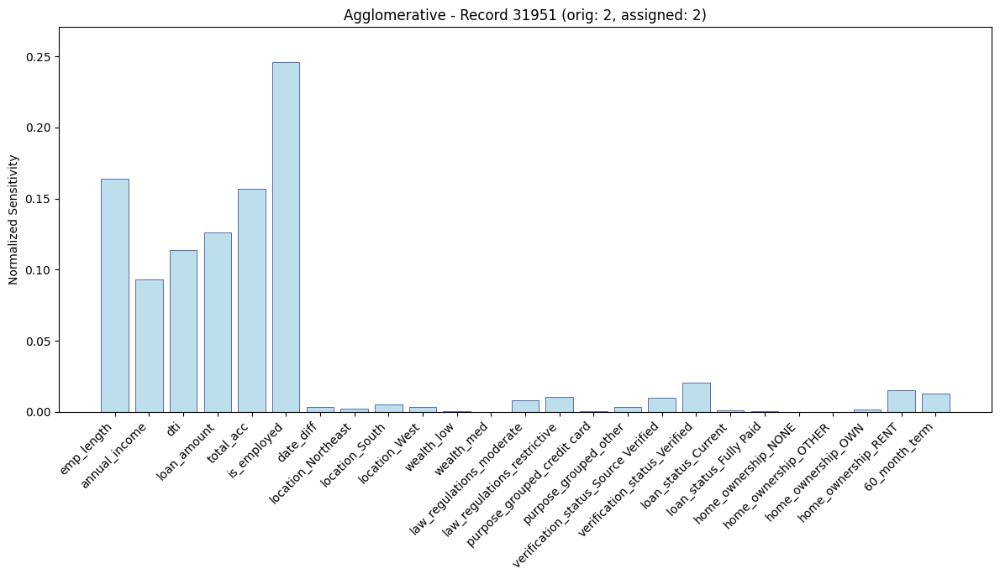

Record 31951: Assigned cluster 2, Original cluster: 2
Pseudo-probabilities: ['0: 0.360', '1: 0.180', '2: 0.460', '3: 0.000']
Distances to centroids: ['0: 3.409', '1: 4.810', '2: 2.624', '3: 6.217']
------------------------------------------------------------


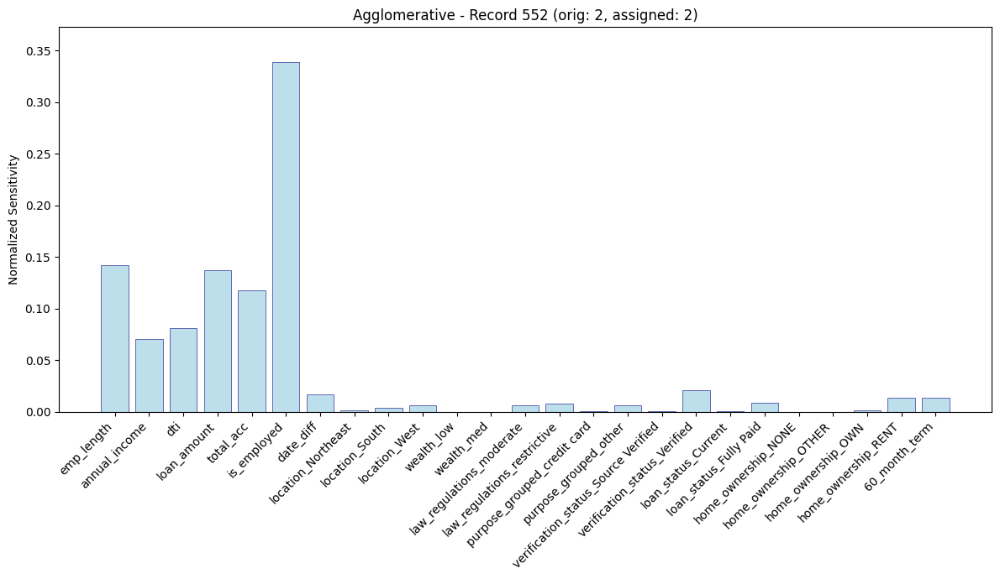

Record 552: Assigned cluster 2, Original cluster: 2
Pseudo-probabilities: ['0: 0.329', '1: 0.164', '2: 0.508', '3: 0.000']
Distances to centroids: ['0: 4.358', '1: 5.468', '2: 3.152', '3: 6.572']
------------------------------------------------------------


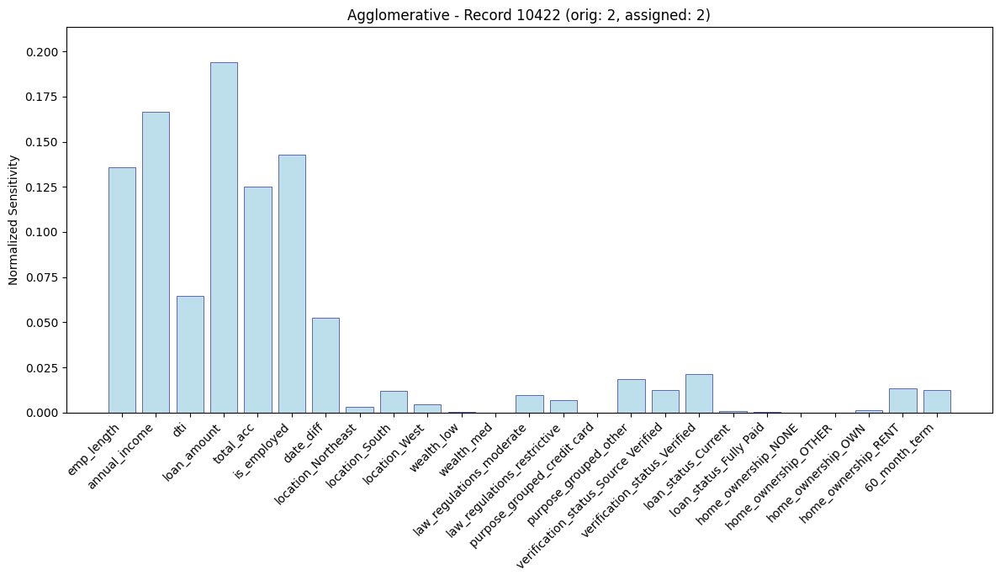

Record 10422: Assigned cluster 2, Original cluster: 2
Pseudo-probabilities: ['0: 0.300', '1: 0.282', '2: 0.418', '3: 0.000']
Distances to centroids: ['0: 3.107', '1: 3.268', '2: 2.054', '3: 5.785']
------------------------------------------------------------


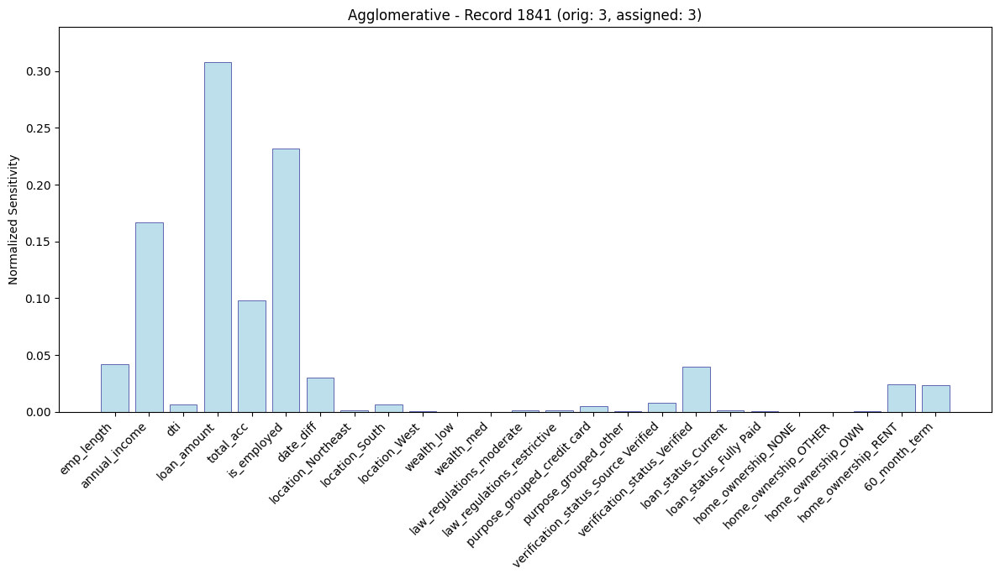

Record 1841: Assigned cluster 3, Original cluster: 3
Pseudo-probabilities: ['0: 0.088', '1: 0.000', '2: 0.142', '3: 0.770']
Distances to centroids: ['0: 6.105', '1: 6.541', '2: 5.832', '3: 2.707']
------------------------------------------------------------


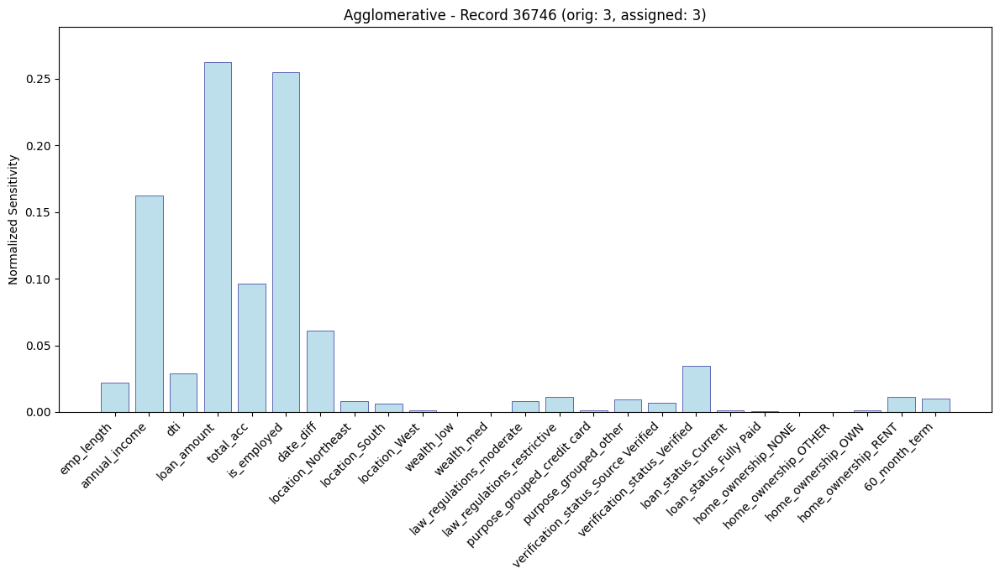

Record 36746: Assigned cluster 3, Original cluster: 3
Pseudo-probabilities: ['0: 0.125', '1: 0.000', '2: 0.145', '3: 0.730']
Distances to centroids: ['0: 5.921', '1: 6.593', '2: 5.816', '3: 2.664']
------------------------------------------------------------


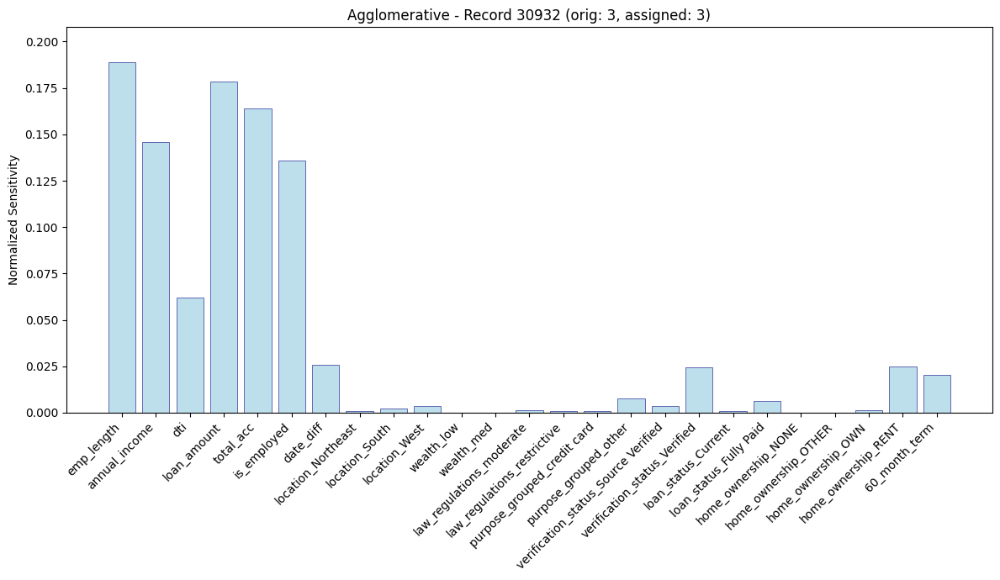

Record 30932: Assigned cluster 3, Original cluster: 3
Pseudo-probabilities: ['0: 0.101', '1: 0.058', '2: 0.000', '3: 0.841']
Distances to centroids: ['0: 5.780', '1: 5.965', '2: 6.212', '3: 2.633']
------------------------------------------------------------


In [95]:
sensitivity_analysis_agglomerative(agglomerative2, data2, cluster_col='cluster', n_samples=3)

In [101]:
cluster0 = data2[data2['cluster'] == 0]
cluster1 = data2[data2['cluster'] == 1]
cluster2 = data2[data2['cluster'] == 2]
cluster3 = data2[data2['cluster'] == 3]
clusters =[cluster0, cluster1, cluster2, cluster3]

In [102]:
for i, cluster in enumerate(clusters):
    count = cluster.shape[0]
    print(f"Cluster {i}: {count}")

Cluster 0: 15347
Cluster 1: 5998
Cluster 2: 15793
Cluster 3: 1438


In [103]:
for i, cluster in enumerate(clusters):
    count = cluster[cluster['is_employed'] > 0].shape[0] #osoby zatrudnione
    print(f"Cluster {i}: {count}")

Cluster 0: 15347
Cluster 1: 5998
Cluster 2: 15793
Cluster 3: 0


In [ ]:
data_after = pd.read_csv("data\\financial_loan.csv")

In [107]:
data_after['cluster'] = labels_dict['agglomerative2']

In [108]:
cluster0_a = data_after[data_after['cluster'] == 0]
cluster1_a = data_after[data_after['cluster'] == 1]
cluster2_a = data_after[data_after['cluster'] == 2]
cluster3_a = data_after[data_after['cluster'] == 3]
clusters_after =[cluster0_a, cluster1_a, cluster2_a, cluster3_a]

In [110]:
data_after.columns

Index(['id', 'address_state', 'application_type', 'emp_length', 'emp_title',
       'grade', 'home_ownership', 'issue_date', 'last_credit_pull_date',
       'last_payment_date', 'loan_status', 'next_payment_date', 'member_id',
       'purpose', 'sub_grade', 'term', 'verification_status', 'annual_income',
       'dti', 'installment', 'int_rate', 'loan_amount', 'total_acc',
       'total_payment', 'cluster'],
      dtype='object')

In [130]:
for i, cluster in enumerate(clusters_after):
    count1 = cluster[cluster['grade'].isin(['A', 'B', 'C'])].shape[0] 
    count2 = cluster.shape[0] 
    print(f"Cluster {i}: {count1/count2}")

Cluster 0: 0.790643122434352
Cluster 1: 0.5966988996332111
Cluster 2: 0.787754068258089
Cluster 3: 0.7739916550764951


In [138]:
data_after['home_ownership'].value_counts()

home_ownership
RENT        18439
MORTGAGE    17198
OWN          2838
OTHER          98
NONE            3
Name: count, dtype: int64

In [144]:
for i, cluster in enumerate(clusters_after):
    count = cluster[cluster['home_ownership'].isin(['OWN'])].shape[0] 
    count2 = cluster.shape[0] 
    print(f"Cluster {i}: {count/count2}")

Cluster 0: 0.07369518472665668
Cluster 1: 0.057685895298432814
Cluster 2: 0.07370353954283543
Cluster 3: 0.13699582753824757
